In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# https://arxiv.org/pdf/2006.11239.pdf

import torch
from torch import optim, nn

import json
from tqdm import tqdm
from random import randint

from load_dataset import load_dataset, plot_image, load_contour
from UNet import UNet, UNet_conditional
from torchvision.transforms import v2
from matplotlib import pyplot as plt
from IPython.display import clear_output

device = "cuda"

pimages = load_dataset().to(device)
pimages.shape

with open("labels/pokedex.json") as json_data:
    data = json.load(json_data)

height = [float(str(d['profile']['height']).split()[0]) for d in data]
height = torch.tensor(height, device=device)
#height

types = [d['type'] for d in data]
all_types = list(set([d[0] for d in types]))

def get_index(tp):
    if len(tp) == 1:
        return all_types.index(tp[0]), len(all_types)
    return all_types.index(tp[0]), all_types.index(tp[1])

types = torch.tensor([get_index(t) for t in types], device=device)

contour = load_contour().to(device)
contour.shape

torch.Size([3, 386, 1, 64, 64])

In [2]:
T = 500
beta = torch.linspace(0.001, 0.03, T, device=device)

alpha = 1 - beta

alpha_ = torch.zeros(T, device=device)

for i in range(T):
    alpha_[i] = torch.prod(alpha[0:i+1])

alpha_[-1]

tensor(0.0004, device='cuda:0')

In [3]:
alpha_

tensor([9.9900e-01, 9.9794e-01, 9.9683e-01, 9.9566e-01, 9.9443e-01, 9.9315e-01,
        9.9181e-01, 9.9041e-01, 9.8896e-01, 9.8746e-01, 9.8589e-01, 9.8428e-01,
        9.8261e-01, 9.8088e-01, 9.7910e-01, 9.7727e-01, 9.7539e-01, 9.7345e-01,
        9.7145e-01, 9.6941e-01, 9.6731e-01, 9.6517e-01, 9.6297e-01, 9.6072e-01,
        9.5842e-01, 9.5607e-01, 9.5366e-01, 9.5121e-01, 9.4872e-01, 9.4617e-01,
        9.4357e-01, 9.4093e-01, 9.3824e-01, 9.3550e-01, 9.3272e-01, 9.2989e-01,
        9.2701e-01, 9.2409e-01, 9.2113e-01, 9.1812e-01, 9.1506e-01, 9.1197e-01,
        9.0883e-01, 9.0565e-01, 9.0243e-01, 8.9917e-01, 8.9586e-01, 8.9252e-01,
        8.8914e-01, 8.8572e-01, 8.8226e-01, 8.7876e-01, 8.7523e-01, 8.7166e-01,
        8.6805e-01, 8.6441e-01, 8.6073e-01, 8.5702e-01, 8.5327e-01, 8.4949e-01,
        8.4568e-01, 8.4184e-01, 8.3796e-01, 8.3405e-01, 8.3012e-01, 8.2615e-01,
        8.2216e-01, 8.1813e-01, 8.1408e-01, 8.1000e-01, 8.0590e-01, 8.0177e-01,
        7.9761e-01, 7.9343e-01, 7.8922e-

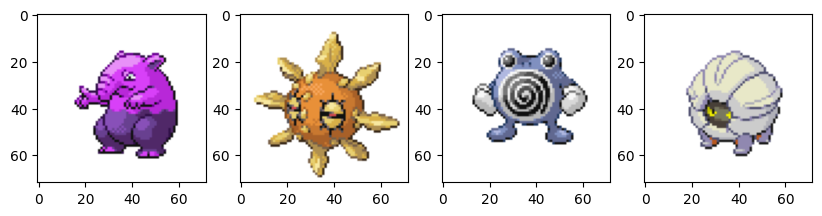

In [4]:
transform = v2.Compose([
    v2.Pad(6, 1.0),
    v2.RandomCrop((64+6, 64+6)),
    v2.Pad(1, 1.0),
    v2.RandomApply([v2.ColorJitter()], 0.1),
    v2.RandomApply([v2.RandomChannelPermutation()], 0.1),
    v2.RandomGrayscale(p = 0.1),
])

source = randint(0, 2)
batch = torch.randperm(385)[:4]
x0 = pimages[source, batch]
x0 = torch.stack([transform(x) for x in x0], dim=0)

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
plot_image(x0[0], axes[0])
plot_image(x0[1], axes[1])
plot_image(x0[2], axes[2])
plot_image(x0[3], axes[3])
plt.show()

In [5]:
def isigmoid(x):
    eps = 0.05
    return torch.log(x + eps) - torch.log(1 - x + eps)

In [6]:
model = UNet_conditional(3, 3, time_dim=512, num_classes=len(all_types) + 1).to(device)

@torch.no_grad
def generate_image():
    model.eval()

    N = 3

    x = torch.randn((N, 3, 72, 72), device=device)

    ty = [["Grass"], ["Fire"], ["Water"]]
    ty = torch.tensor([get_index(t) for t in ty], device=device)
    
    for t in reversed(range(T)):
        tt = torch.tensor([t] * N, device=device)

        z = torch.randn_like(x)
        if t == 0:
            z *= 0

        #x0 = model(x, tt)
        #x = torch.sqrt(alpha_[t]) * x0 + torch.sqrt(1-alpha_[t]) * z

        e = model(x, tt, ty) * (1 - alpha[t]) / torch.sqrt(1 - alpha_[t])
        x = (1 / torch.sqrt(alpha[t])) * (x - e) + z * torch.sqrt(beta[t])

        #clear_output(wait=True)
        #fig, axes = plt.subplots(1, N, figsize=(10, 10))
        #for i in range(N):
        #    plot_image(torch.sigmoid(x-e)[i], axes[i])
        #plt.show()

    x = torch.sigmoid(x)
    
    fig, axes = plt.subplots(1, N, figsize=(10, 10))
    for i in range(N):
        plot_image(x[i], axes[i])
    plt.show()

    model.train()

In [7]:
#sd = torch.load("model.pt")
#model.load_state_dict(sd)

#generate_image()

  0%|                                                                                                                                                | 0/200001 [00:00<?, ?it/s]

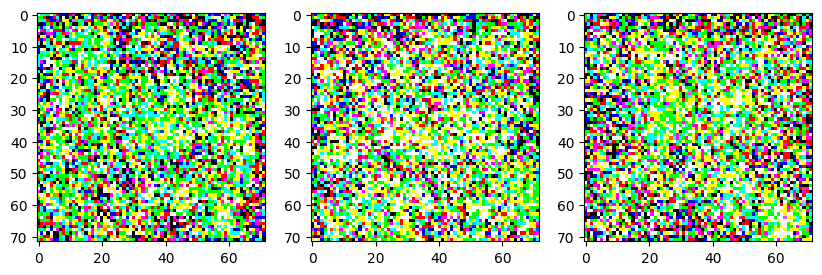

0.05993288:   0%|▌                                                                                                                       | 997/200001 [00:34<1:43:06, 32.17it/s]

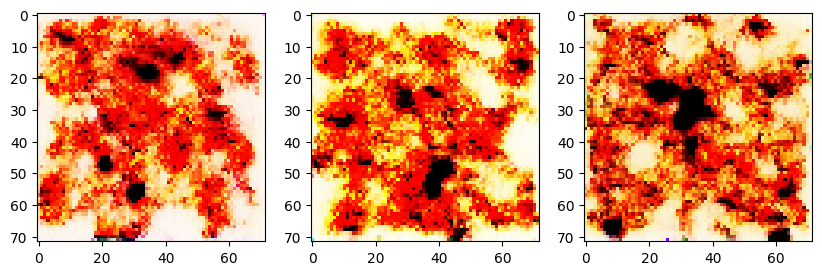

0.12473933:   1%|█▏                                                                                                                     | 1997/200001 [01:08<1:43:09, 31.99it/s]

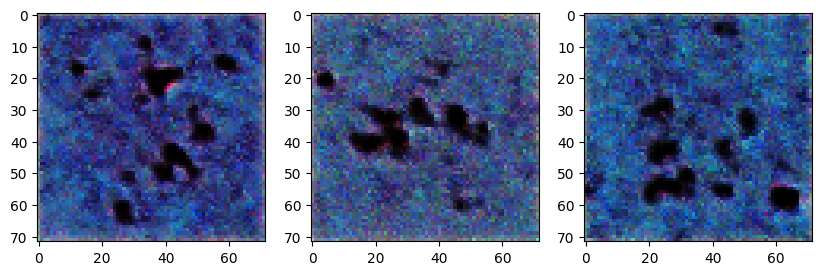

0.11040330:   1%|█▊                                                                                                                     | 2997/200001 [01:43<1:42:02, 32.18it/s]

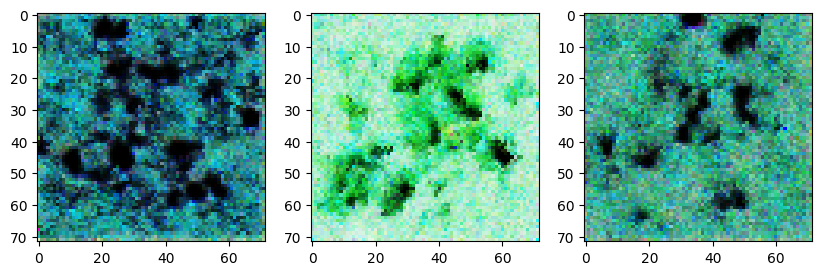

0.04091156:   2%|██▍                                                                                                                    | 3997/200001 [02:17<1:42:24, 31.90it/s]

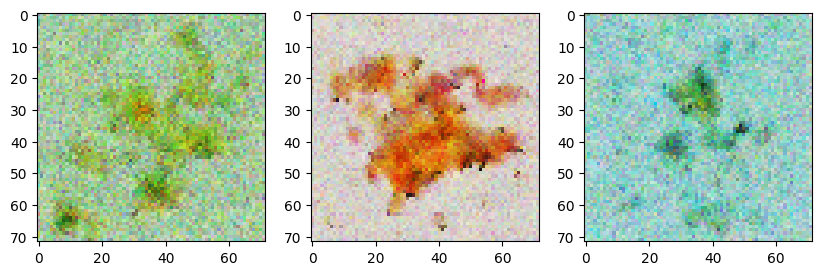

0.02778163:   2%|██▉                                                                                                                    | 4997/200001 [02:52<1:41:44, 31.94it/s]

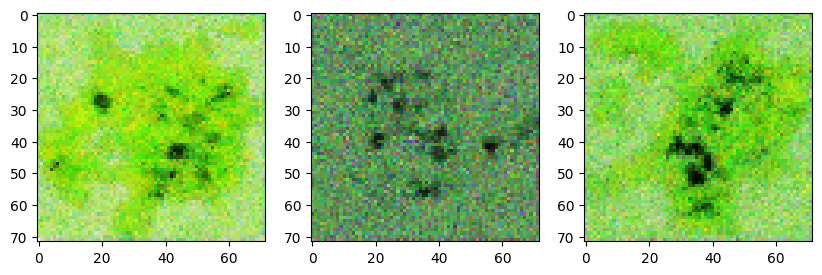

0.07263112:   3%|███▌                                                                                                                   | 5997/200001 [03:26<1:41:13, 31.94it/s]

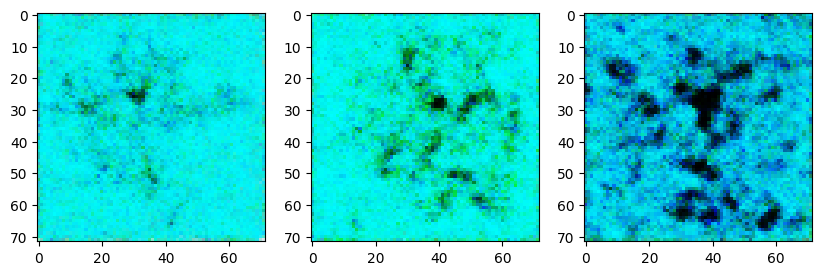

0.09135409:   3%|████▏                                                                                                                  | 6997/200001 [04:01<1:40:48, 31.91it/s]

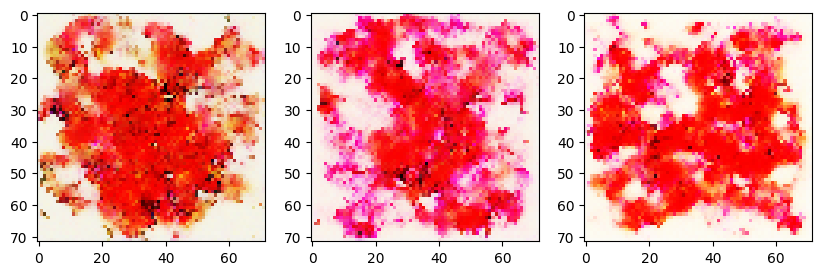

0.02572791:   4%|████▊                                                                                                                  | 7997/200001 [04:36<1:40:12, 31.93it/s]

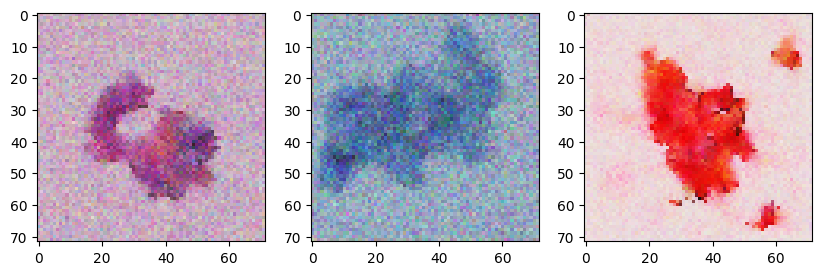

0.05299292:   4%|█████▎                                                                                                                 | 8997/200001 [05:10<1:39:38, 31.95it/s]

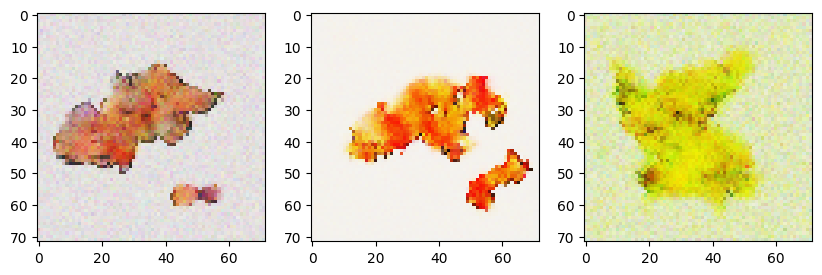

0.03405466:   5%|█████▉                                                                                                                 | 9997/200001 [05:45<1:39:10, 31.93it/s]

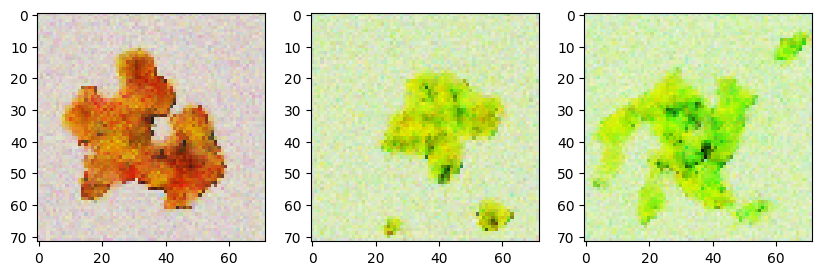

0.03178852:   5%|██████▍                                                                                                               | 10997/200001 [06:19<1:38:34, 31.96it/s]

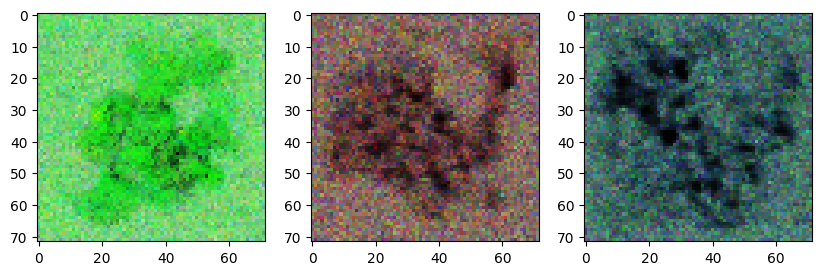

0.01427108:   6%|███████                                                                                                               | 11997/200001 [06:54<1:38:12, 31.91it/s]

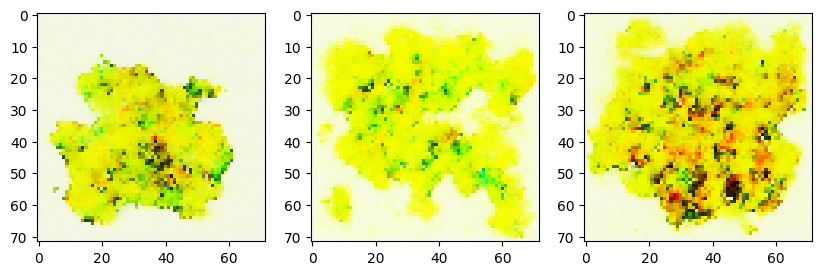

0.03799230:   6%|███████▋                                                                                                              | 12997/200001 [07:28<1:37:36, 31.93it/s]

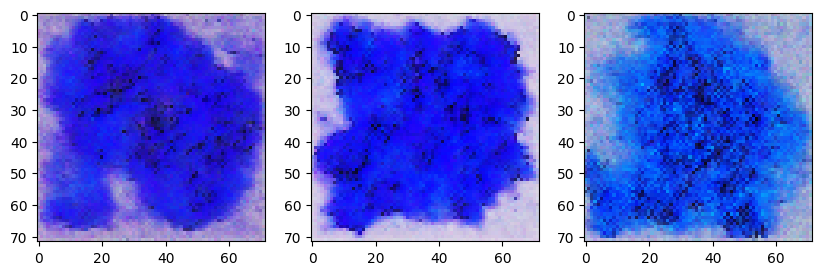

0.06161109:   7%|████████▎                                                                                                             | 13997/200001 [08:03<1:37:15, 31.87it/s]

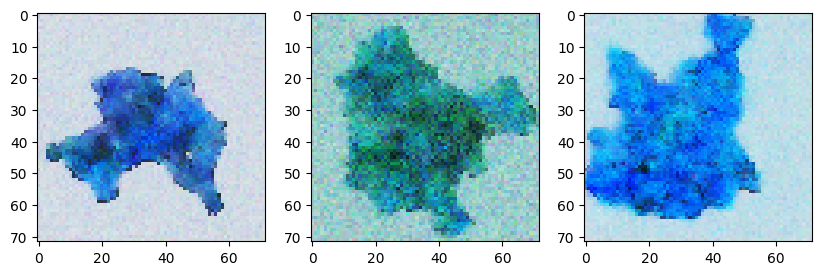

0.03359096:   7%|████████▊                                                                                                             | 14997/200001 [08:37<1:36:42, 31.88it/s]

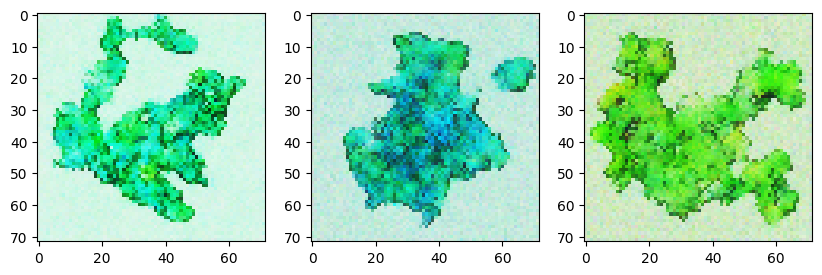

0.03616286:   8%|█████████▍                                                                                                            | 15997/200001 [09:12<1:36:13, 31.87it/s]

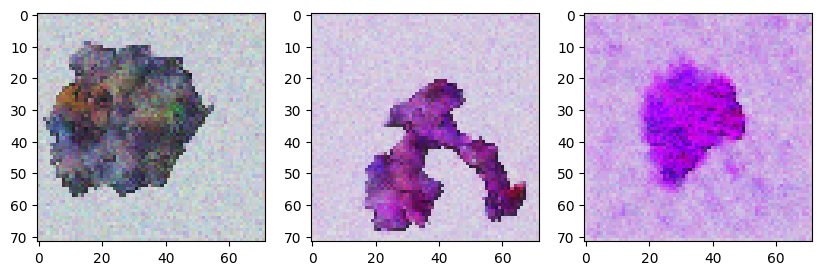

0.05269677:   8%|██████████                                                                                                            | 16997/200001 [09:47<1:35:28, 31.94it/s]

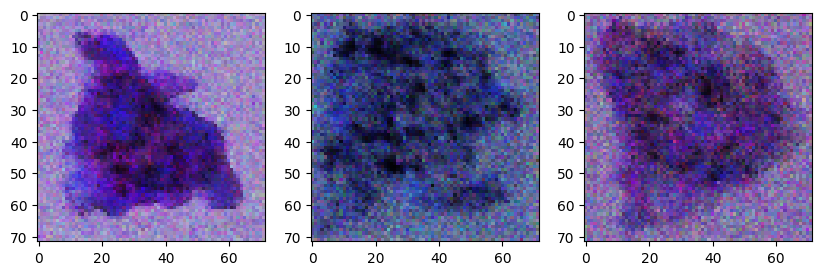

0.04808600:   9%|██████████▌                                                                                                           | 17997/200001 [10:21<1:35:06, 31.89it/s]

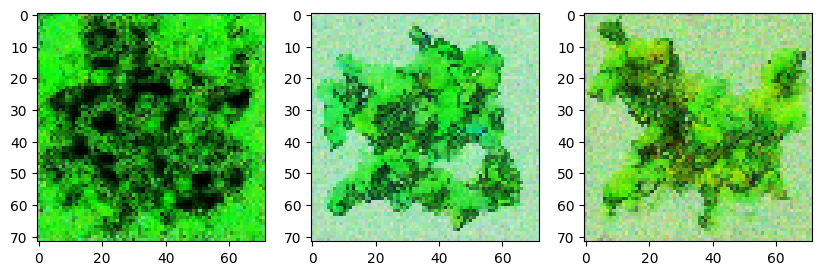

0.05841361:   9%|███████████▏                                                                                                          | 18997/200001 [10:56<1:34:48, 31.82it/s]

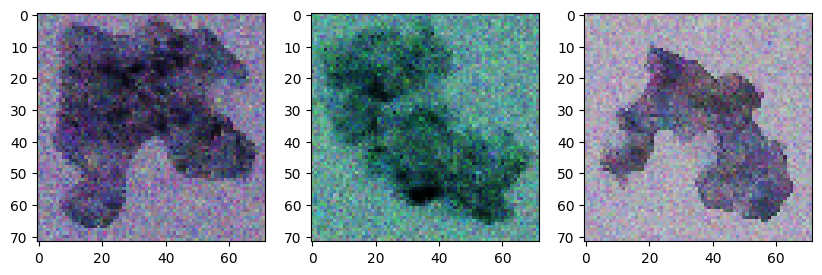

0.03267643:  10%|███████████▊                                                                                                          | 19997/200001 [11:30<1:34:04, 31.89it/s]

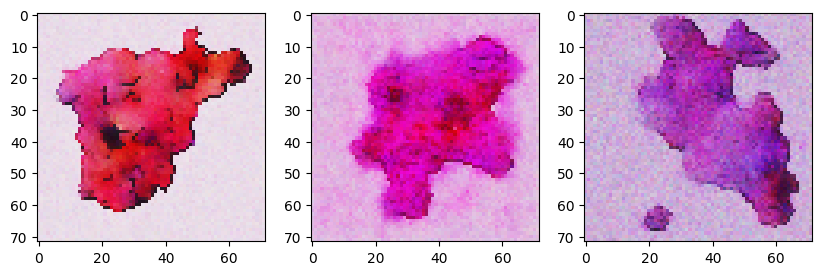

0.04131527:  10%|████████████▍                                                                                                         | 20997/200001 [12:05<1:33:37, 31.87it/s]

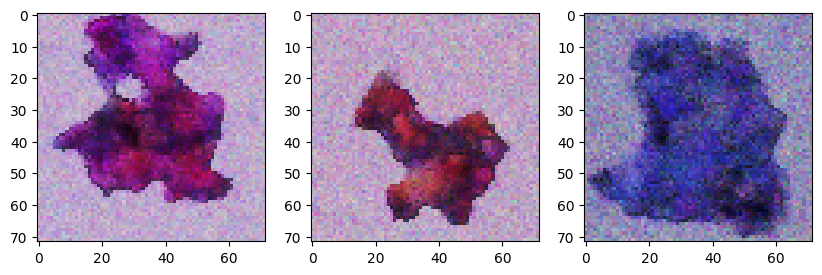

0.03188766:  11%|████████████▉                                                                                                         | 21997/200001 [12:39<1:32:53, 31.94it/s]

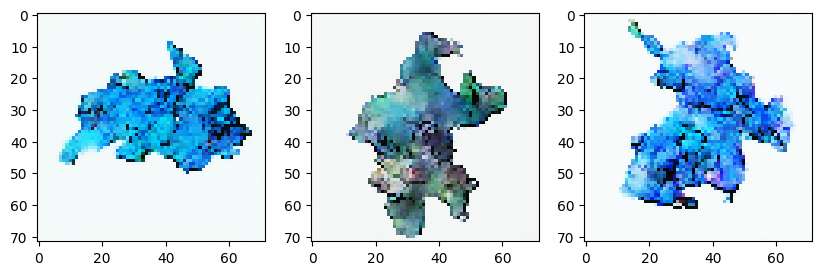

0.03094882:  11%|█████████████▌                                                                                                        | 22997/200001 [13:14<1:32:23, 31.93it/s]

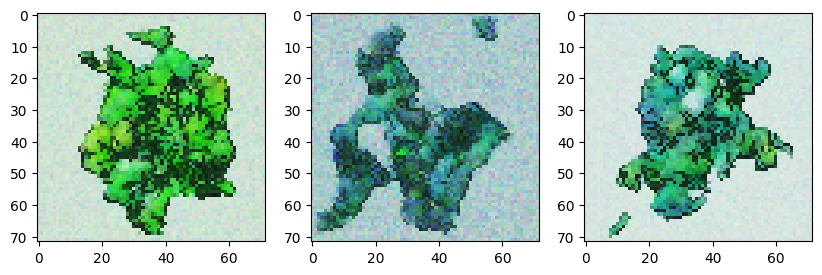

0.03236147:  12%|██████████████▏                                                                                                       | 23997/200001 [13:48<1:32:03, 31.86it/s]

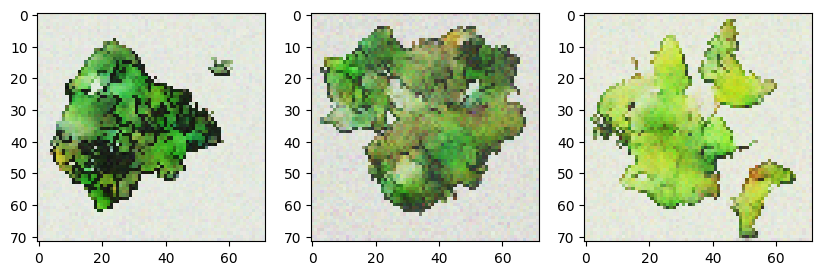

0.04492107:  12%|██████████████▋                                                                                                       | 24997/200001 [14:23<1:31:23, 31.91it/s]

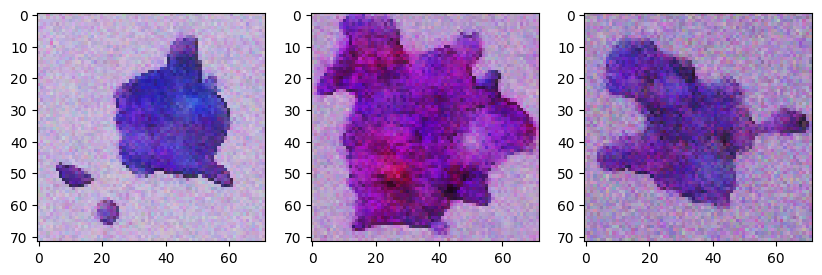

0.04639274:  13%|███████████████▎                                                                                                      | 25997/200001 [14:57<1:30:51, 31.92it/s]

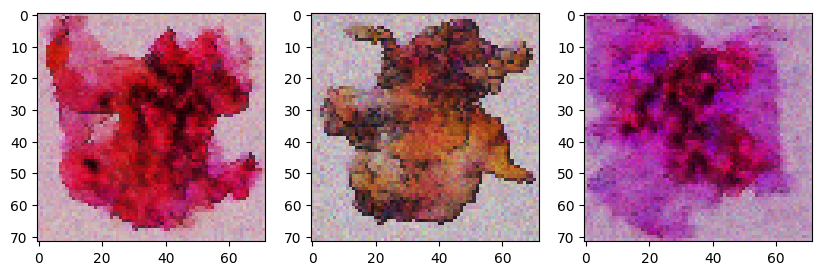

0.03930414:  13%|███████████████▉                                                                                                      | 26997/200001 [15:32<1:30:20, 31.92it/s]

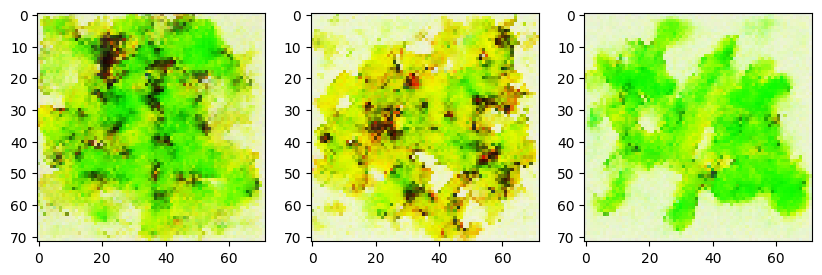

0.02351985:  14%|████████████████▌                                                                                                     | 27997/200001 [16:07<1:29:51, 31.90it/s]

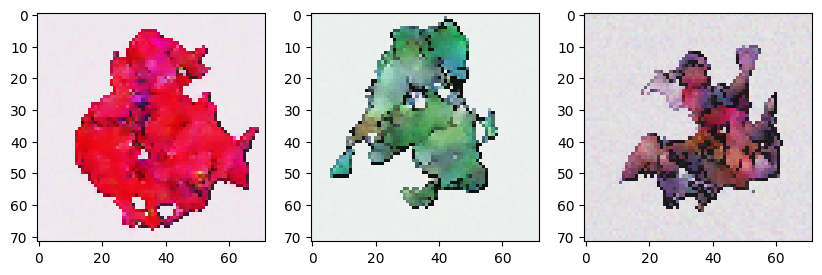

0.03807339:  14%|█████████████████                                                                                                     | 28997/200001 [16:41<1:29:16, 31.92it/s]

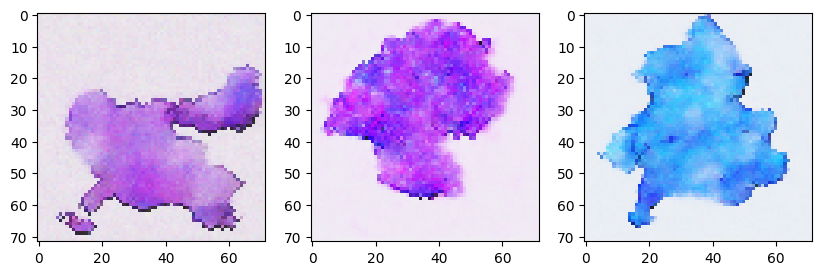

0.02903013:  15%|█████████████████▋                                                                                                    | 29997/200001 [17:16<1:28:51, 31.89it/s]

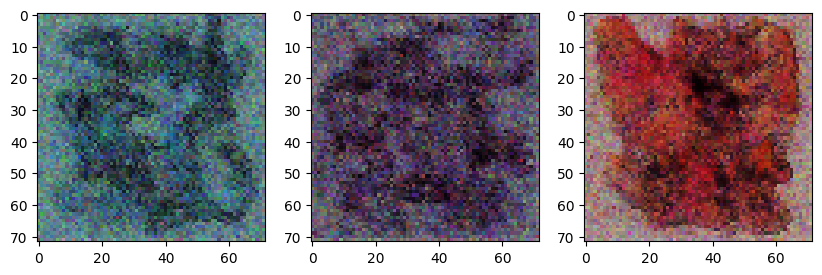

0.03304682:  15%|██████████████████▎                                                                                                   | 30997/200001 [17:50<1:28:11, 31.94it/s]

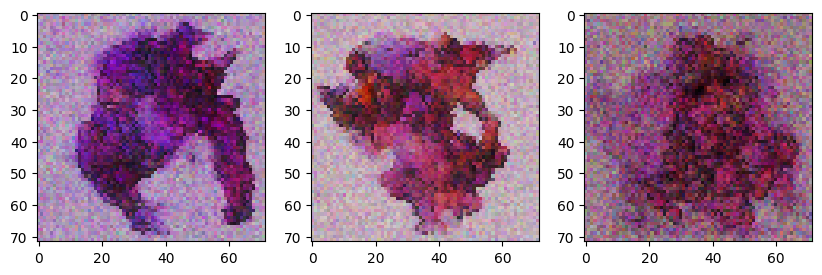

0.02748861:  16%|██████████████████▉                                                                                                   | 31997/200001 [18:25<1:27:32, 31.99it/s]

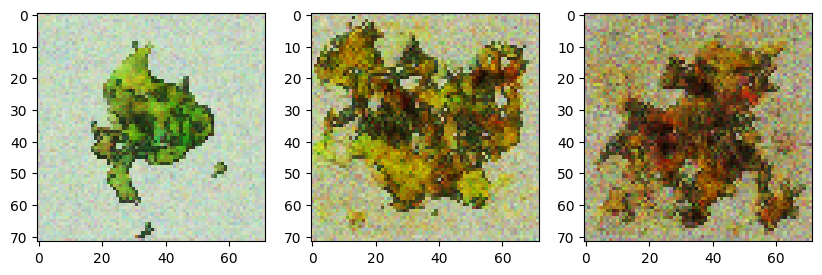

0.02853086:  16%|███████████████████▍                                                                                                  | 32997/200001 [18:59<1:27:13, 31.91it/s]

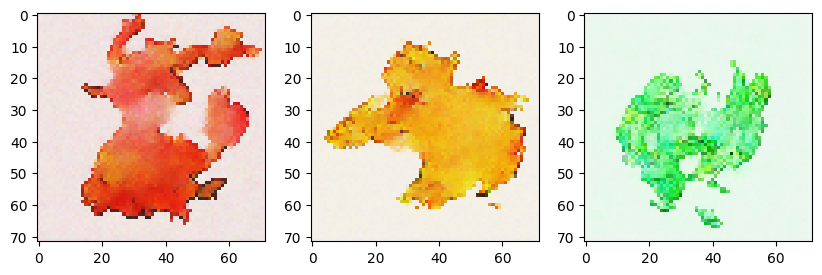

0.02684339:  17%|████████████████████                                                                                                  | 33997/200001 [19:34<1:26:41, 31.92it/s]

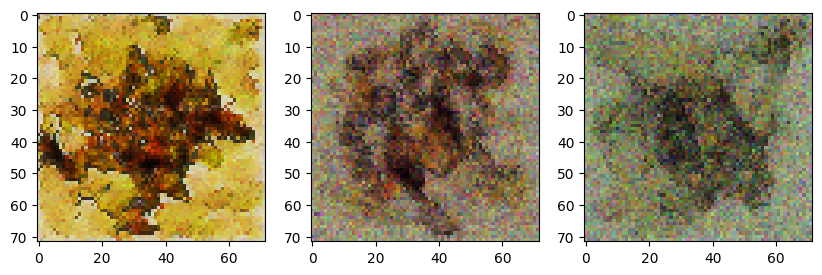

0.01559720:  17%|████████████████████▋                                                                                                 | 34997/200001 [20:08<1:26:15, 31.88it/s]

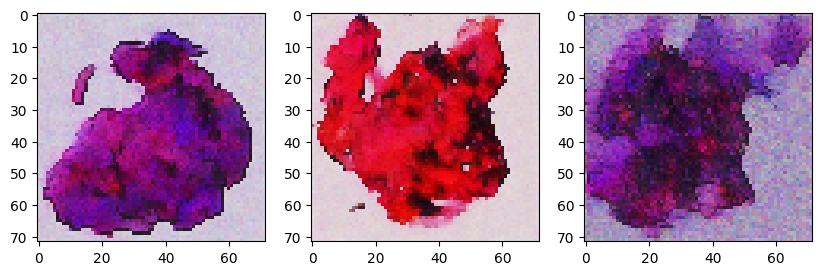

0.02400238:  18%|█████████████████████▏                                                                                                | 35997/200001 [20:43<1:25:40, 31.91it/s]

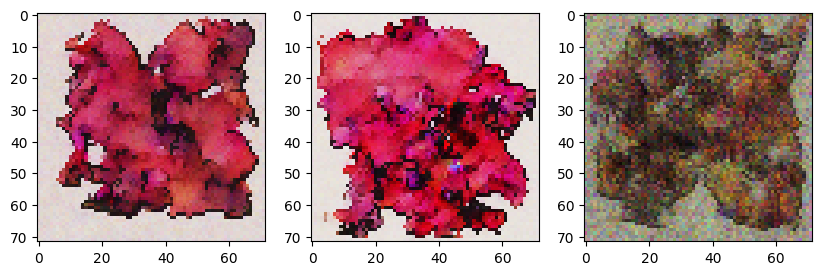

0.02831595:  18%|█████████████████████▊                                                                                                | 36997/200001 [21:17<1:25:09, 31.90it/s]

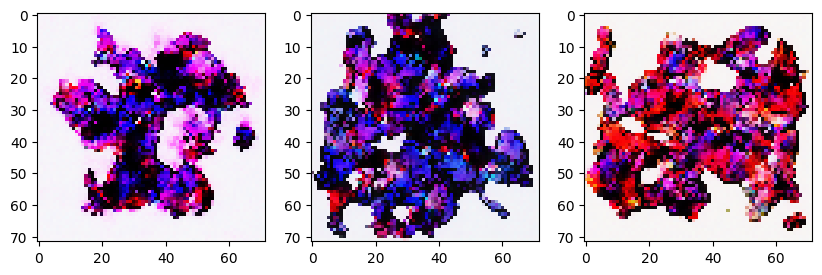

0.02847425:  19%|██████████████████████▍                                                                                               | 37997/200001 [21:52<1:24:35, 31.92it/s]

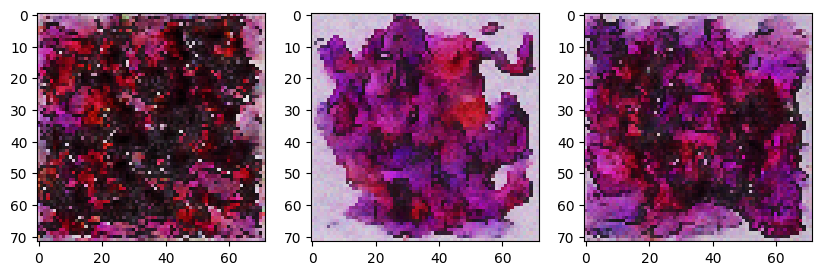

0.05798340:  19%|███████████████████████                                                                                               | 38997/200001 [22:26<1:24:07, 31.90it/s]

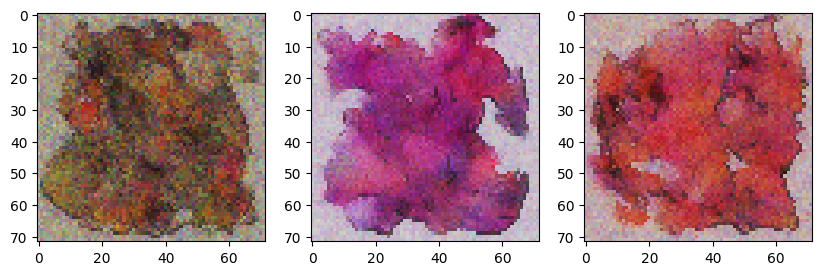

0.05653040:  20%|███████████████████████▌                                                                                              | 39997/200001 [23:01<1:23:24, 31.97it/s]

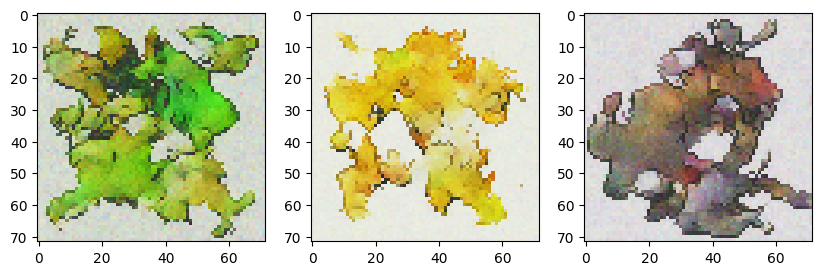

0.04966264:  20%|████████████████████████▏                                                                                             | 40997/200001 [23:35<1:22:55, 31.96it/s]

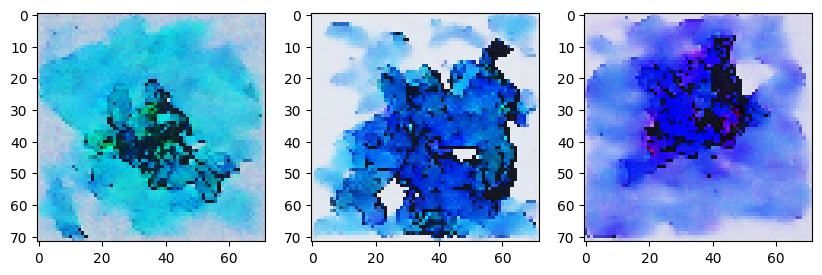

0.01249934:  21%|████████████████████████▊                                                                                             | 41997/200001 [24:10<1:22:36, 31.88it/s]

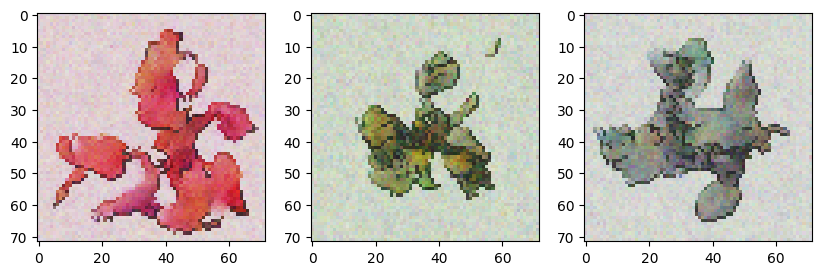

0.02725971:  21%|█████████████████████████▎                                                                                            | 42997/200001 [24:44<1:21:00, 32.30it/s]

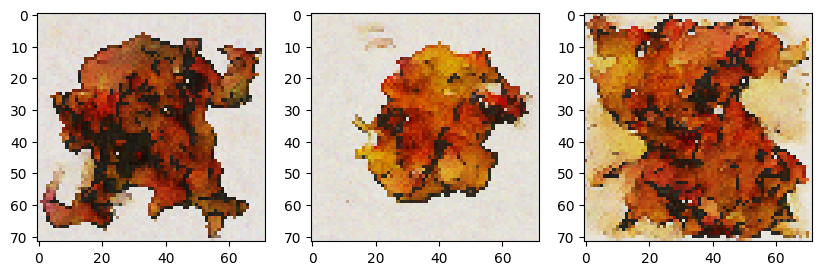

0.04275087:  22%|█████████████████████████▉                                                                                            | 43997/200001 [25:19<1:21:39, 31.84it/s]

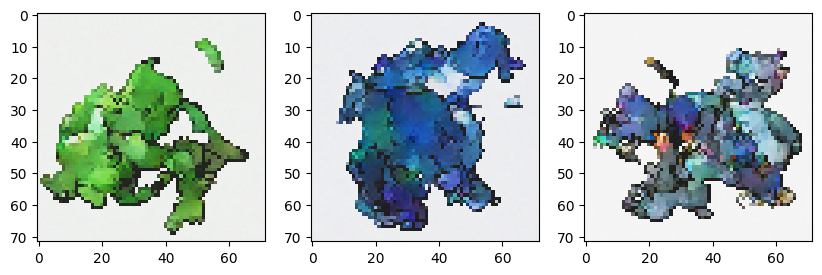

0.03919513:  22%|██████████████████████████▌                                                                                           | 44997/200001 [25:53<1:20:52, 31.94it/s]

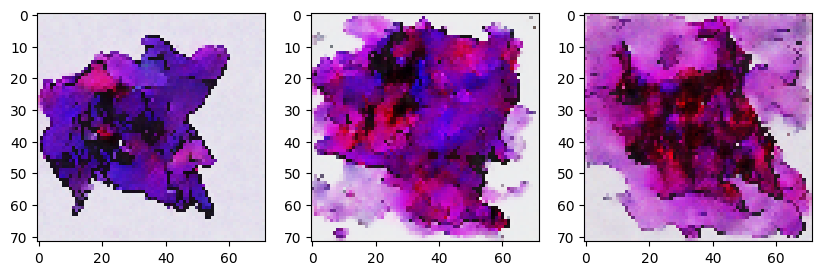

0.02145770:  23%|███████████████████████████▏                                                                                          | 45997/200001 [26:28<1:20:27, 31.90it/s]

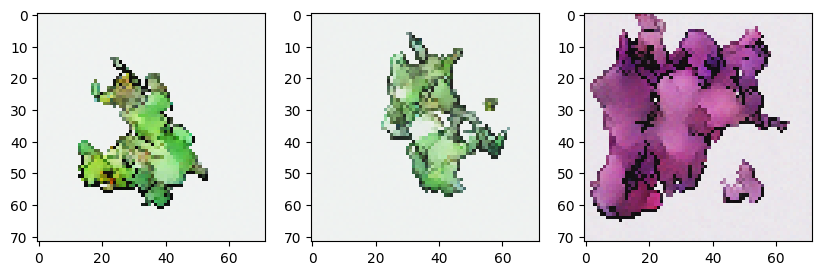

0.05486996:  23%|███████████████████████████▋                                                                                          | 46997/200001 [27:02<1:19:58, 31.89it/s]

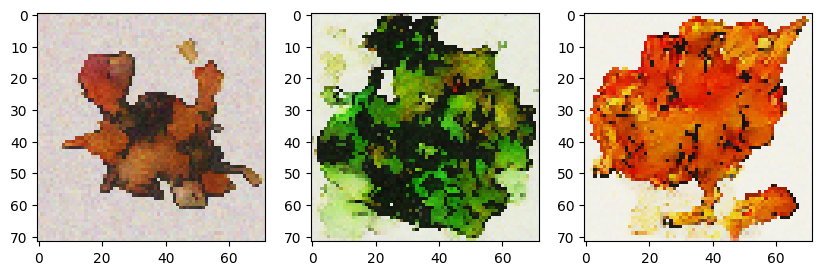

0.04366539:  24%|████████████████████████████▎                                                                                         | 47997/200001 [27:37<1:19:27, 31.88it/s]

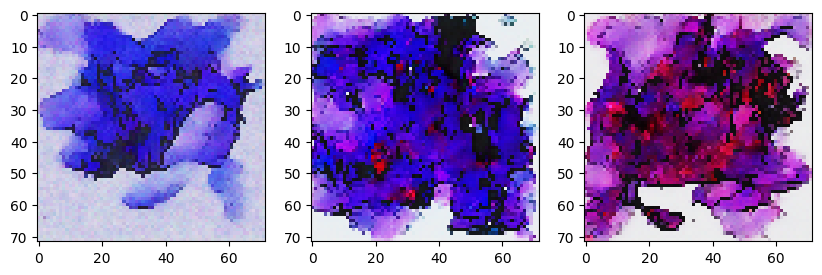

0.02533474:  24%|████████████████████████████▉                                                                                         | 48997/200001 [28:12<1:18:58, 31.87it/s]

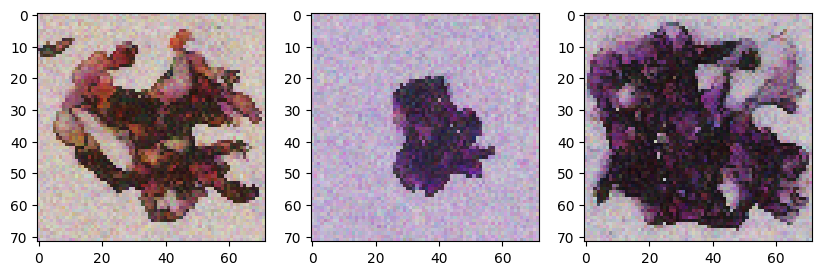

0.04270631:  25%|█████████████████████████████▍                                                                                        | 49997/200001 [28:46<1:18:26, 31.87it/s]

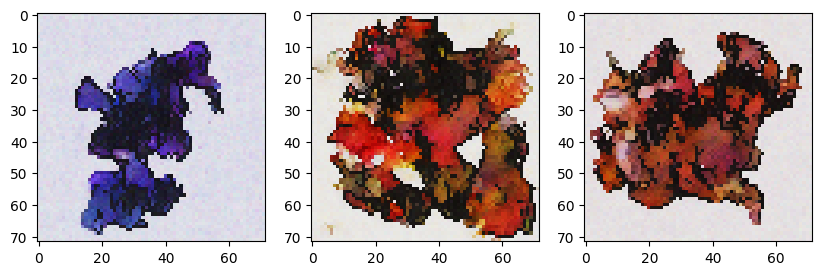

0.04981946:  25%|██████████████████████████████                                                                                        | 50997/200001 [29:21<1:17:59, 31.85it/s]

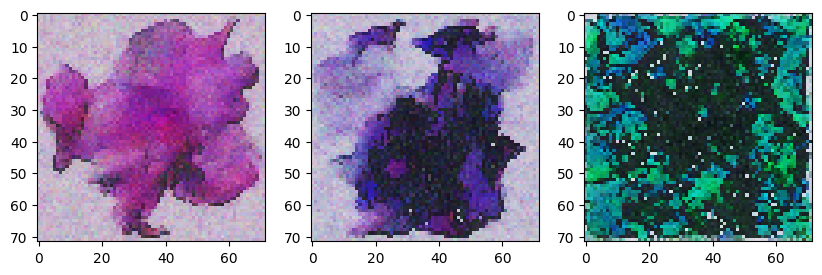

0.06157514:  26%|██████████████████████████████▋                                                                                       | 51997/200001 [29:55<1:17:37, 31.78it/s]

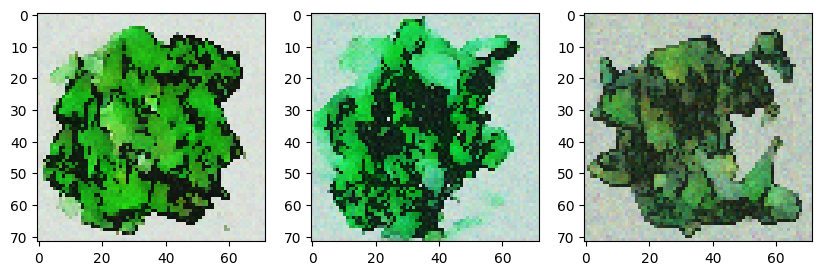

0.02603430:  26%|███████████████████████████████▎                                                                                      | 52997/200001 [30:30<1:16:41, 31.95it/s]

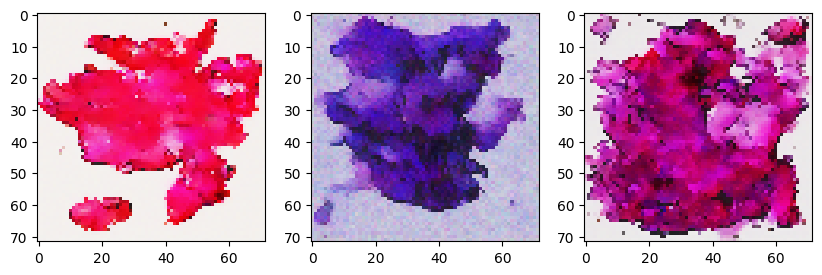

0.01661921:  27%|███████████████████████████████▊                                                                                      | 53997/200001 [31:04<1:16:14, 31.92it/s]

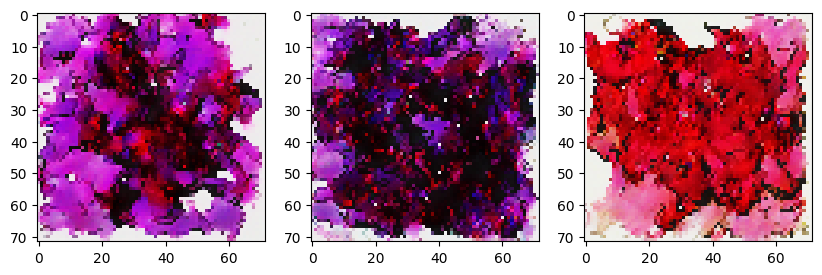

0.02746585:  27%|████████████████████████████████▍                                                                                     | 54997/200001 [31:39<1:15:36, 31.96it/s]

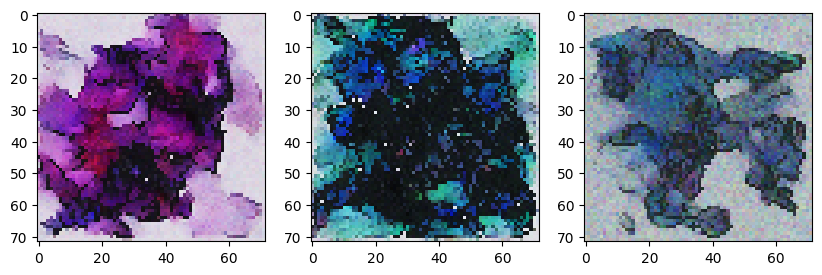

0.05320307:  28%|█████████████████████████████████                                                                                     | 55997/200001 [32:14<1:15:14, 31.90it/s]

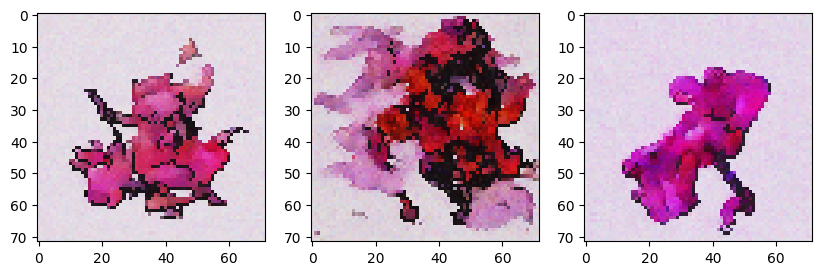

0.01257433:  28%|█████████████████████████████████▋                                                                                    | 56997/200001 [32:48<1:14:37, 31.94it/s]

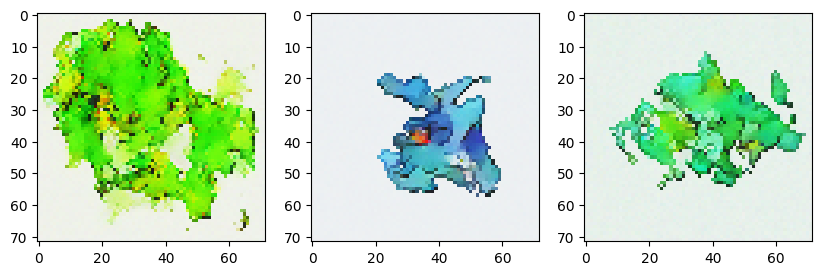

0.02293709:  29%|██████████████████████████████████▏                                                                                   | 57997/200001 [33:23<1:14:07, 31.93it/s]

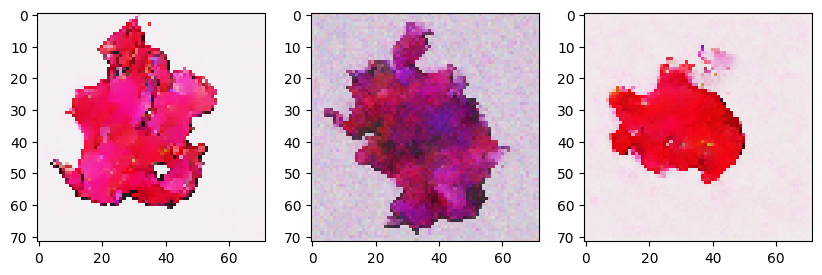

0.04845631:  29%|██████████████████████████████████▊                                                                                   | 58997/200001 [33:57<1:13:38, 31.91it/s]

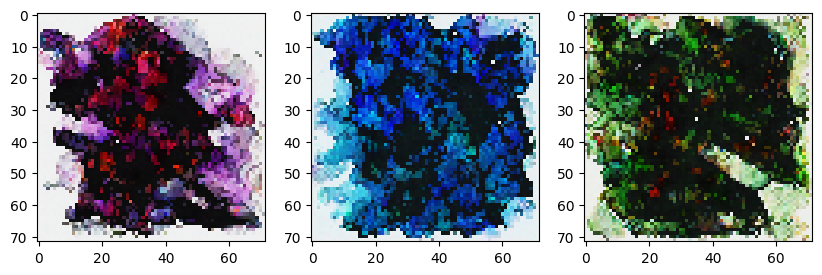

0.04984793:  30%|███████████████████████████████████▍                                                                                  | 59997/200001 [34:32<1:13:15, 31.85it/s]

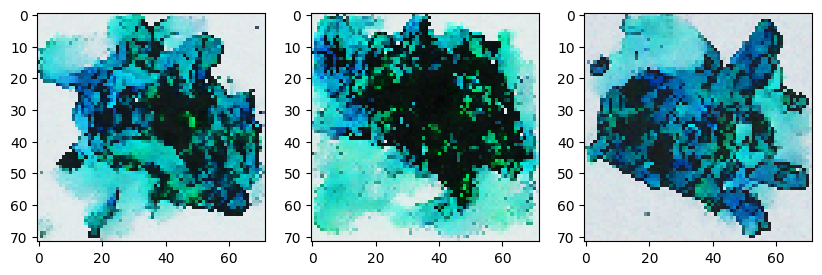

0.03271735:  30%|███████████████████████████████████▉                                                                                  | 60997/200001 [35:06<1:12:27, 31.97it/s]

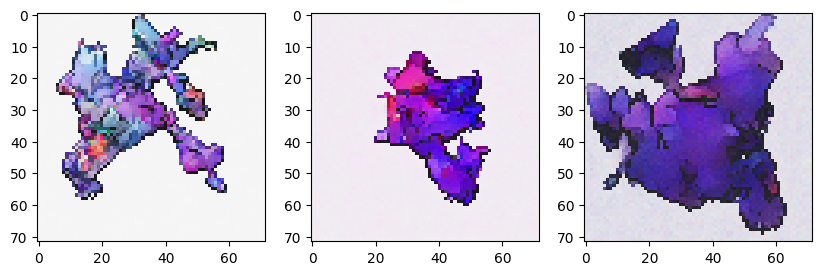

0.04336911:  31%|████████████████████████████████████▌                                                                                 | 61997/200001 [35:41<1:12:05, 31.91it/s]

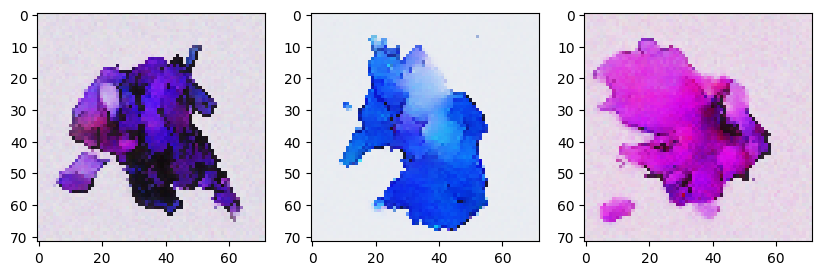

0.04246609:  31%|█████████████████████████████████████▏                                                                                | 62997/200001 [36:15<1:11:39, 31.87it/s]

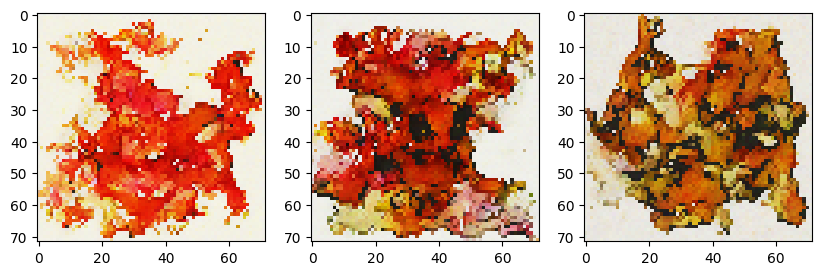

0.06199732:  32%|█████████████████████████████████████▊                                                                                | 63997/200001 [36:50<1:10:55, 31.96it/s]

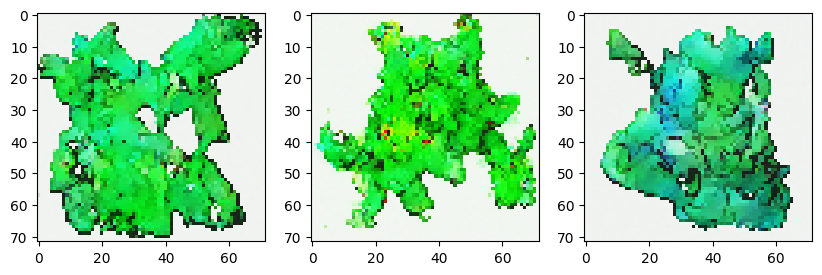

0.02826226:  32%|██████████████████████████████████████▎                                                                               | 64997/200001 [37:24<1:10:31, 31.90it/s]

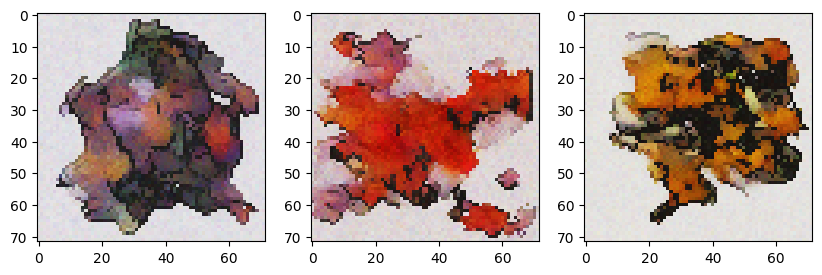

0.04199364:  33%|██████████████████████████████████████▉                                                                               | 65997/200001 [37:59<1:09:57, 31.93it/s]

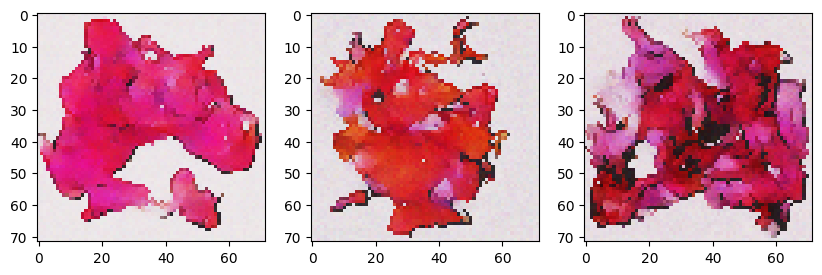

0.03990822:  33%|███████████████████████████████████████▌                                                                              | 66997/200001 [38:33<1:09:29, 31.90it/s]

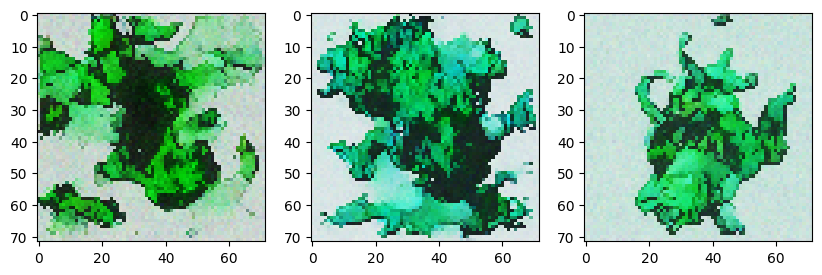

0.01574365:  34%|████████████████████████████████████████                                                                              | 67997/200001 [39:08<1:08:57, 31.91it/s]

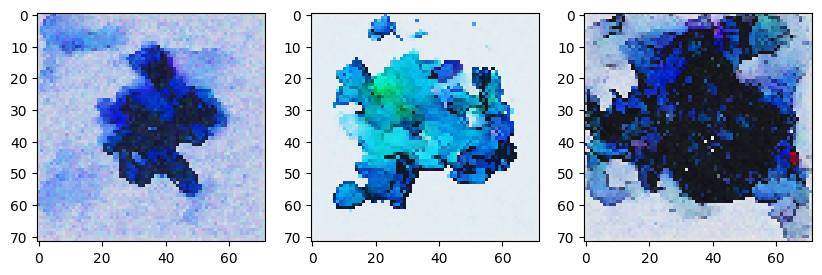

0.03196587:  34%|████████████████████████████████████████▋                                                                             | 68997/200001 [39:42<1:08:23, 31.92it/s]

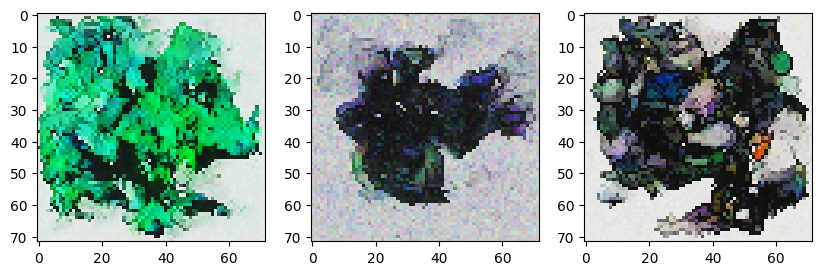

0.02425454:  35%|█████████████████████████████████████████▎                                                                            | 69997/200001 [40:17<1:07:49, 31.94it/s]

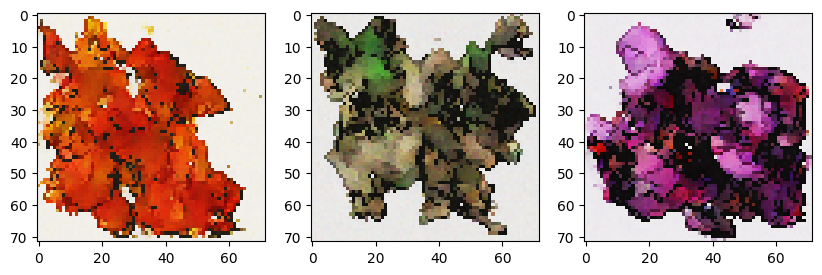

0.06200155:  35%|█████████████████████████████████████████▉                                                                            | 70997/200001 [40:52<1:07:22, 31.91it/s]

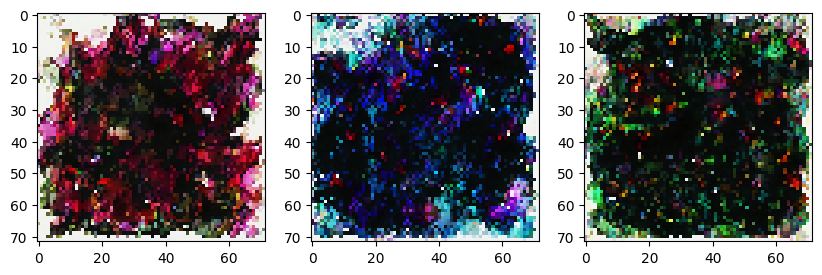

0.04564235:  36%|██████████████████████████████████████████▍                                                                           | 71997/200001 [41:26<1:06:43, 31.98it/s]

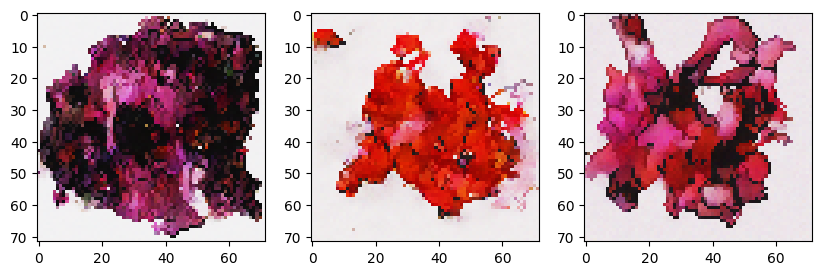

0.01503550:  36%|███████████████████████████████████████████                                                                           | 72997/200001 [42:01<1:06:20, 31.91it/s]

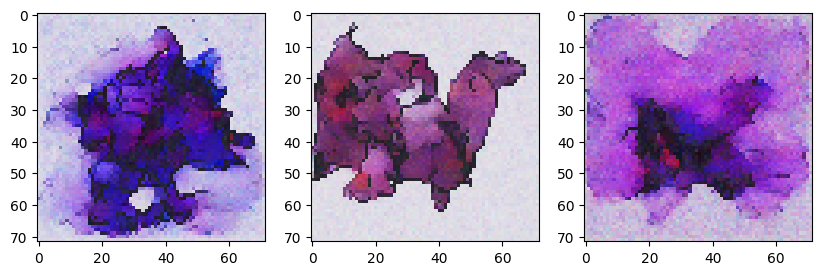

0.05659784:  37%|███████████████████████████████████████████▋                                                                          | 73997/200001 [42:35<1:05:48, 31.91it/s]

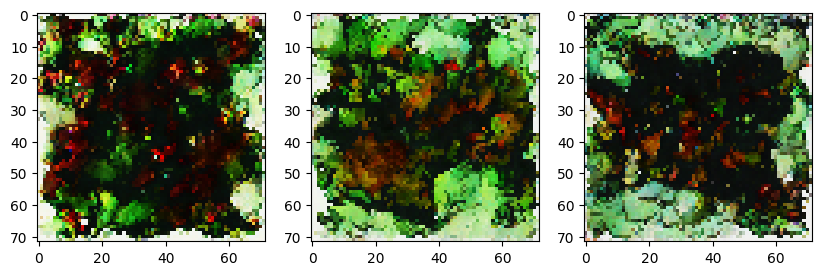

0.04028225:  37%|████████████████████████████████████████████▏                                                                         | 74997/200001 [43:10<1:05:13, 31.94it/s]

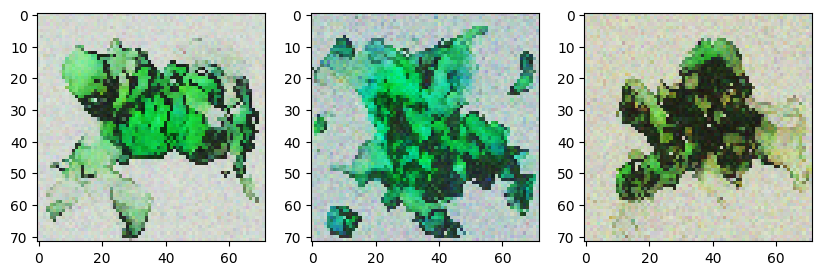

0.02313657:  38%|████████████████████████████████████████████▊                                                                         | 75997/200001 [43:44<1:04:41, 31.95it/s]

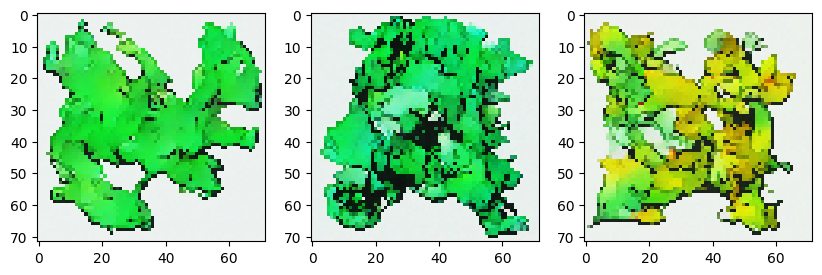

0.02615496:  38%|█████████████████████████████████████████████▍                                                                        | 76997/200001 [44:19<1:04:17, 31.89it/s]

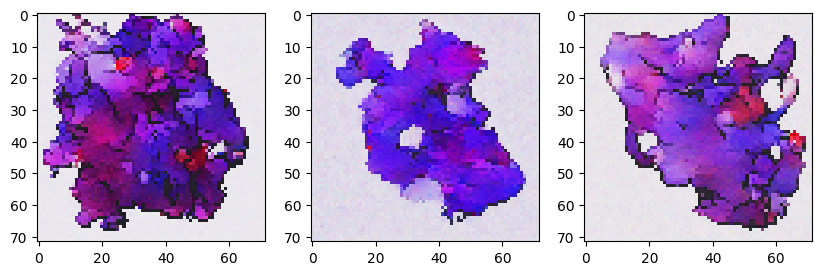

0.02742659:  39%|██████████████████████████████████████████████                                                                        | 77997/200001 [44:53<1:03:47, 31.88it/s]

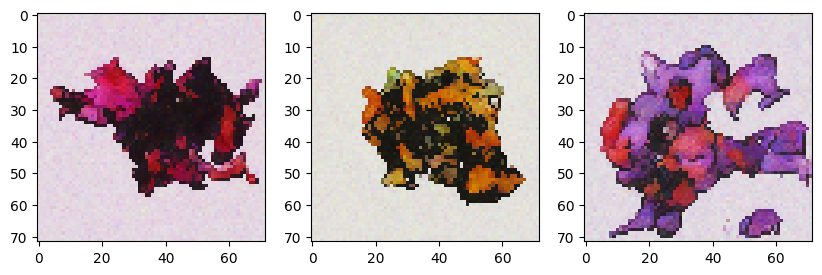

0.05783065:  39%|██████████████████████████████████████████████▌                                                                       | 78997/200001 [45:28<1:03:08, 31.94it/s]

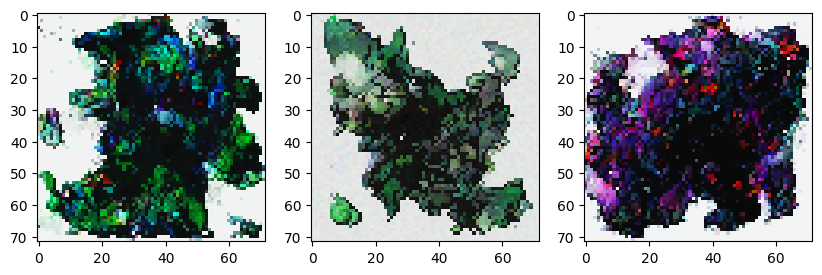

0.04284060:  40%|███████████████████████████████████████████████▏                                                                      | 79997/200001 [46:02<1:02:37, 31.93it/s]

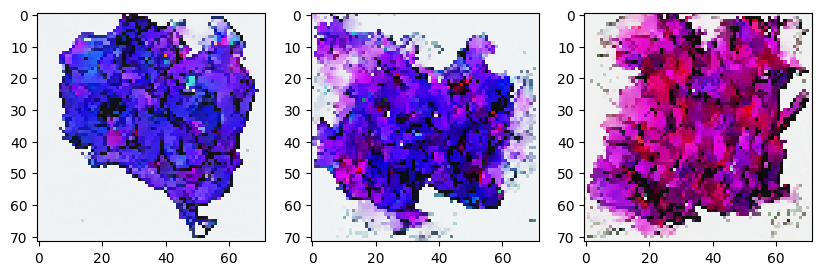

0.02167704:  40%|███████████████████████████████████████████████▊                                                                      | 80997/200001 [46:37<1:02:08, 31.92it/s]

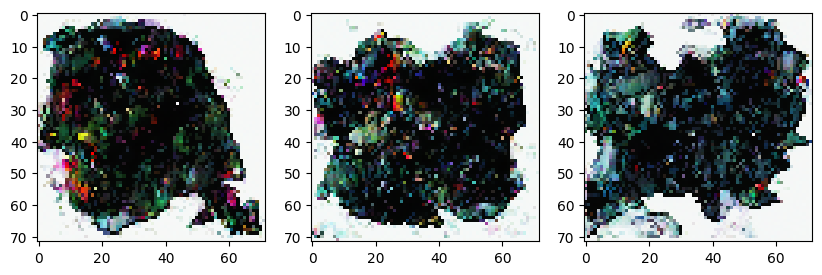

0.02026516:  41%|████████████████████████████████████████████████▍                                                                     | 81997/200001 [47:12<1:01:37, 31.91it/s]

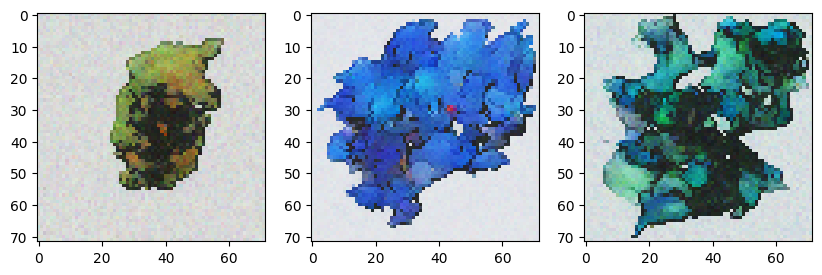

0.02011474:  41%|████████████████████████████████████████████████▉                                                                     | 82997/200001 [47:46<1:01:24, 31.75it/s]

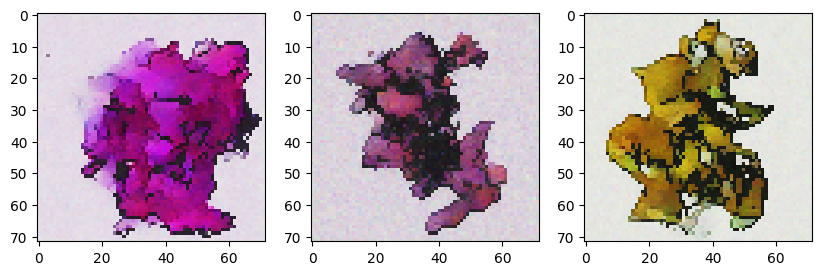

0.03049874:  42%|█████████████████████████████████████████████████▌                                                                    | 83997/200001 [48:21<1:00:42, 31.85it/s]

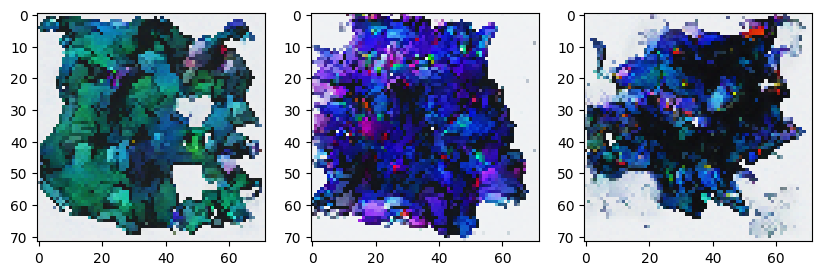

0.02656179:  42%|██████████████████████████████████████████████████▏                                                                   | 84997/200001 [48:55<1:00:09, 31.87it/s]

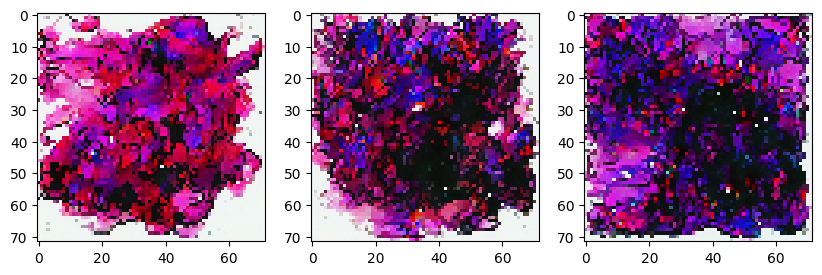

0.04010123:  43%|███████████████████████████████████████████████████▌                                                                    | 85997/200001 [49:30<59:23, 31.99it/s]

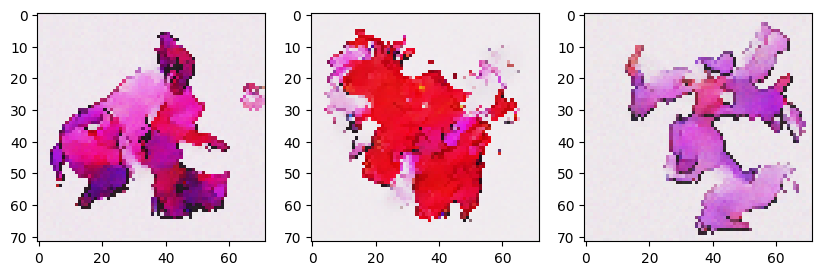

0.04108516:  43%|████████████████████████████████████████████████████▏                                                                   | 86997/200001 [50:04<59:04, 31.89it/s]

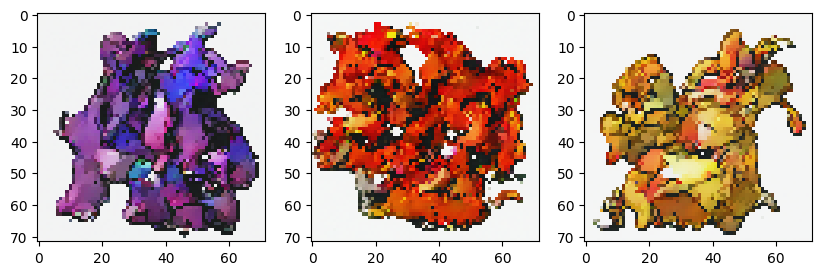

0.03917321:  44%|████████████████████████████████████████████████████▊                                                                   | 87997/200001 [50:39<58:35, 31.86it/s]

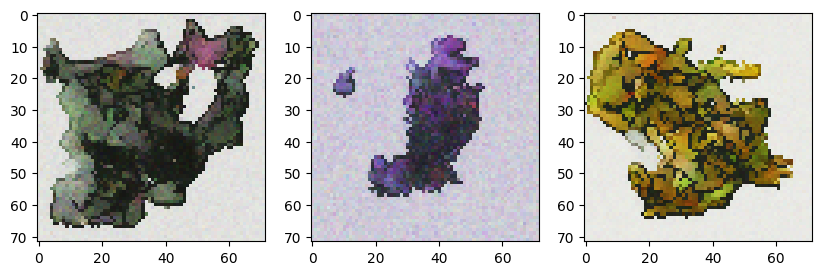

0.03006863:  44%|█████████████████████████████████████████████████████▍                                                                  | 88997/200001 [51:13<58:01, 31.89it/s]

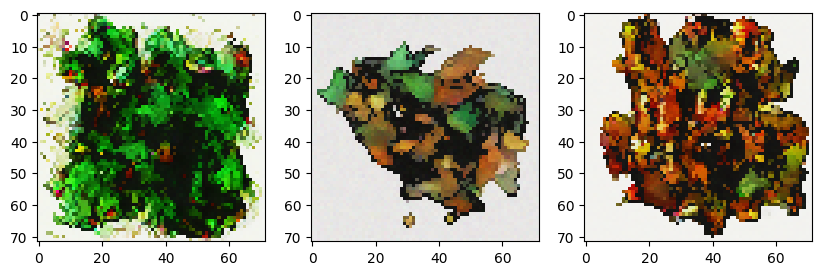

0.03673799:  45%|█████████████████████████████████████████████████████▉                                                                  | 89997/200001 [51:48<57:21, 31.97it/s]

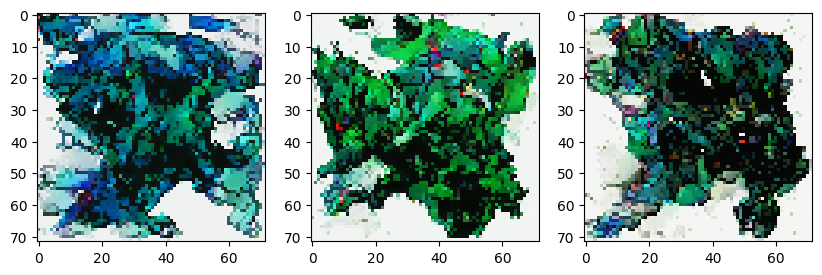

0.03576721:  45%|██████████████████████████████████████████████████████▌                                                                 | 90997/200001 [52:22<56:51, 31.95it/s]

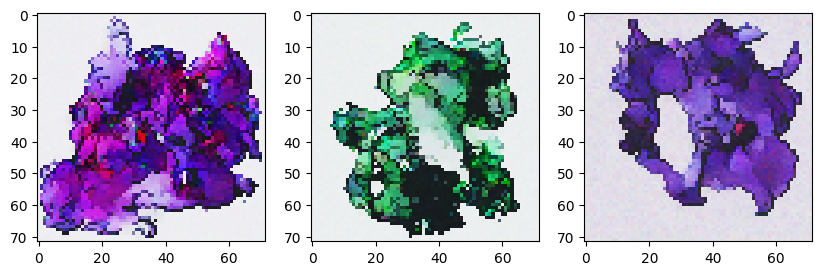

0.03547040:  46%|███████████████████████████████████████████████████████▏                                                                | 91997/200001 [52:57<56:30, 31.85it/s]

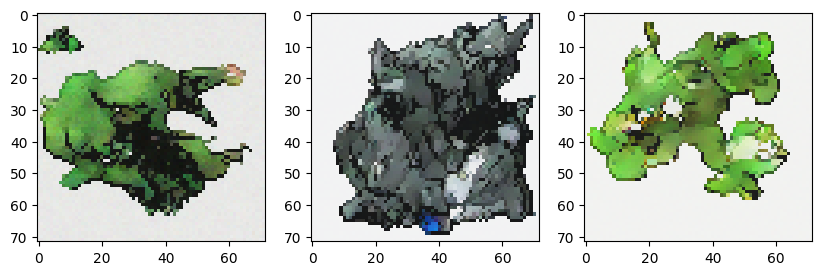

0.02988780:  46%|███████████████████████████████████████████████████████▊                                                                | 92997/200001 [53:31<55:54, 31.90it/s]

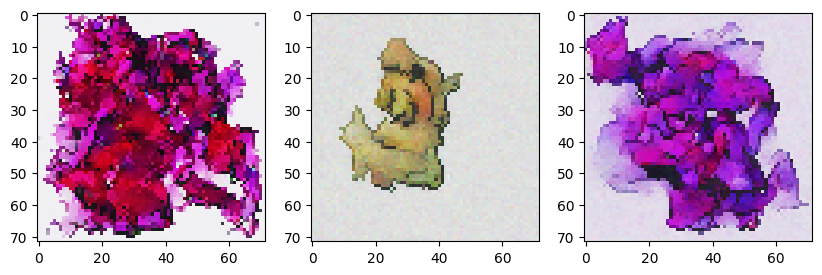

0.04605643:  47%|████████████████████████████████████████████████████████▍                                                               | 93997/200001 [54:06<55:29, 31.84it/s]

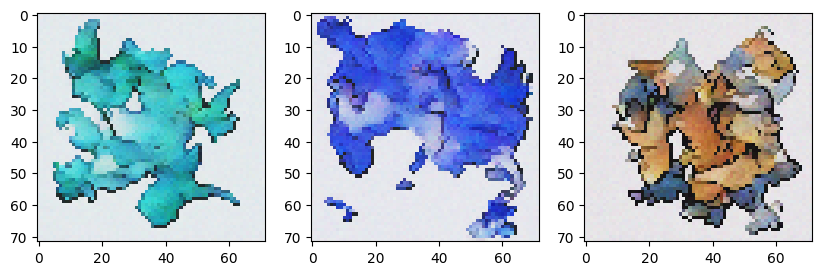

0.02268649:  47%|████████████████████████████████████████████████████████▉                                                               | 94997/200001 [54:41<54:38, 32.03it/s]

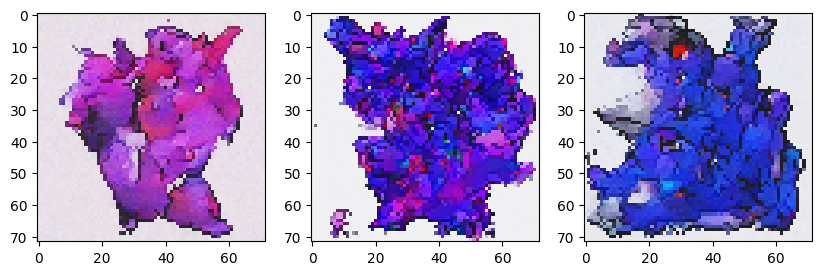

0.04729339:  48%|█████████████████████████████████████████████████████████▌                                                              | 95997/200001 [55:15<54:22, 31.88it/s]

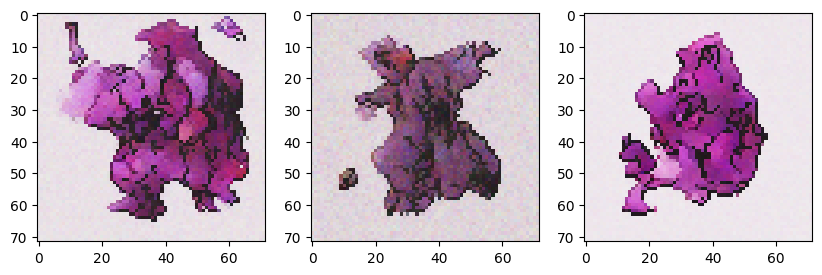

0.01762555:  48%|██████████████████████████████████████████████████████████▏                                                             | 96997/200001 [55:50<53:45, 31.94it/s]

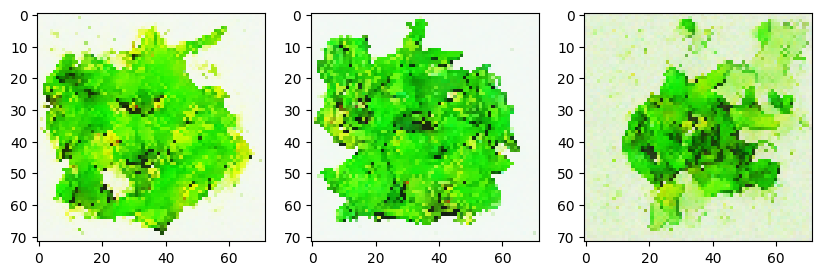

0.04160379:  49%|██████████████████████████████████████████████████████████▊                                                             | 97997/200001 [56:24<53:11, 31.96it/s]

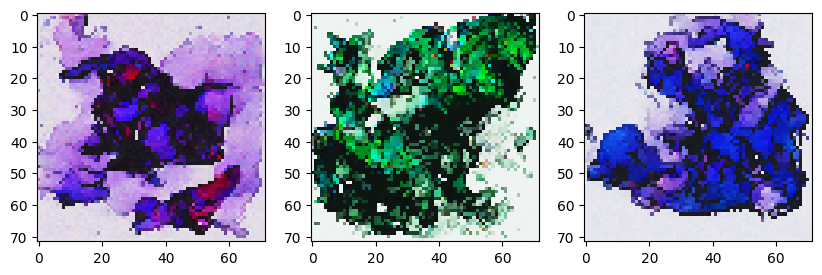

0.01537231:  49%|███████████████████████████████████████████████████████████▍                                                            | 98997/200001 [56:59<52:37, 31.99it/s]

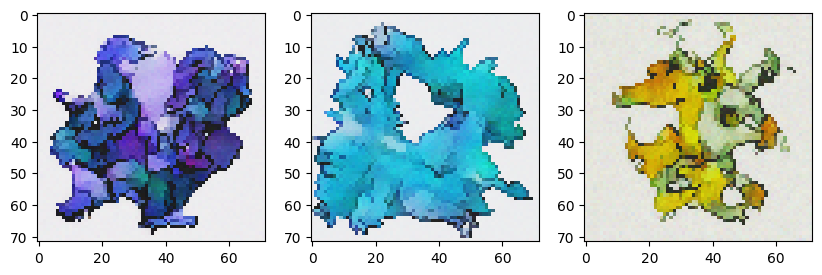

0.01470915:  50%|███████████████████████████████████████████████████████████▉                                                            | 99997/200001 [57:33<52:10, 31.94it/s]

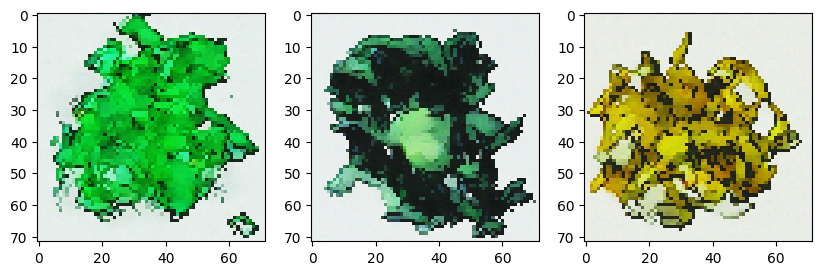

0.03191847:  50%|████████████████████████████████████████████████████████████                                                           | 100997/200001 [58:08<51:39, 31.94it/s]

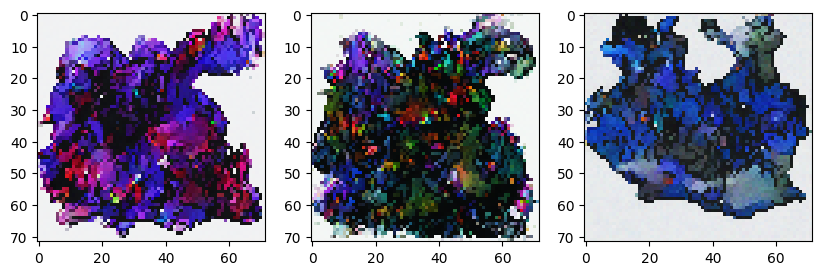

0.04100319:  51%|████████████████████████████████████████████████████████████▋                                                          | 101997/200001 [58:42<51:08, 31.94it/s]

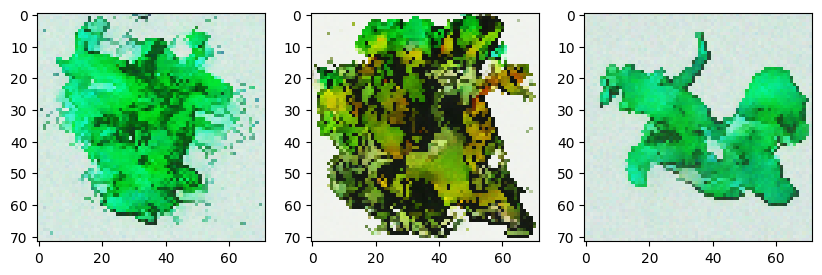

0.03709453:  51%|█████████████████████████████████████████████████████████████▎                                                         | 102997/200001 [59:17<50:38, 31.92it/s]

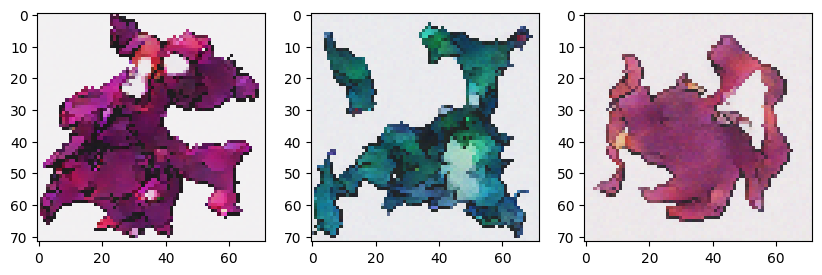

0.03313185:  52%|█████████████████████████████████████████████████████████████▉                                                         | 103997/200001 [59:51<50:10, 31.89it/s]

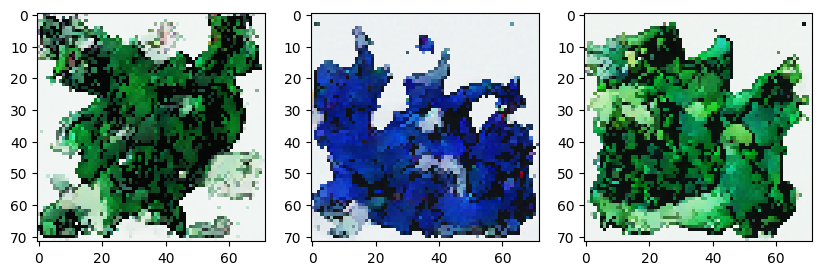

0.03569785:  52%|█████████████████████████████████████████████████████████████▍                                                       | 104997/200001 [1:00:26<49:38, 31.89it/s]

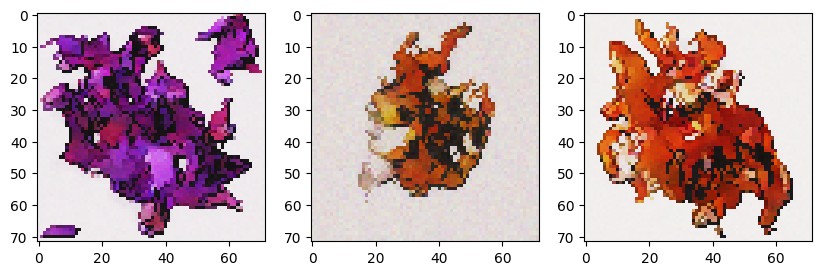

0.03062448:  53%|██████████████████████████████████████████████████████████████                                                       | 105997/200001 [1:01:00<49:08, 31.88it/s]

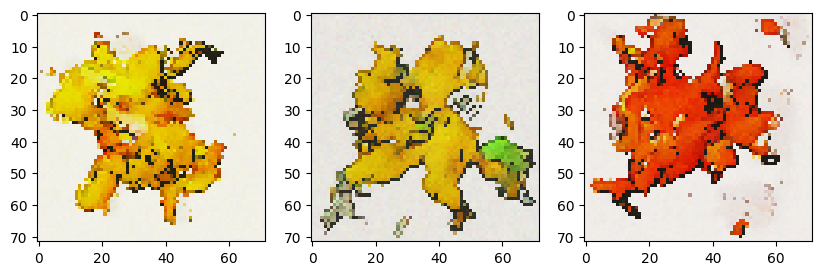

0.05191253:  53%|██████████████████████████████████████████████████████████████▌                                                      | 106997/200001 [1:01:35<48:28, 31.97it/s]

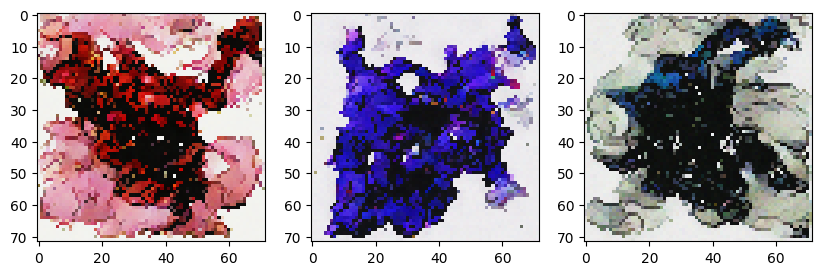

0.02737981:  54%|███████████████████████████████████████████████████████████████▏                                                     | 107997/200001 [1:02:09<47:57, 31.98it/s]

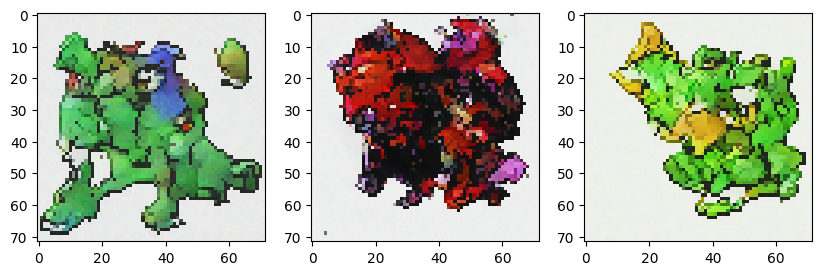

0.05928827:  54%|███████████████████████████████████████████████████████████████▊                                                     | 108997/200001 [1:02:44<47:38, 31.84it/s]

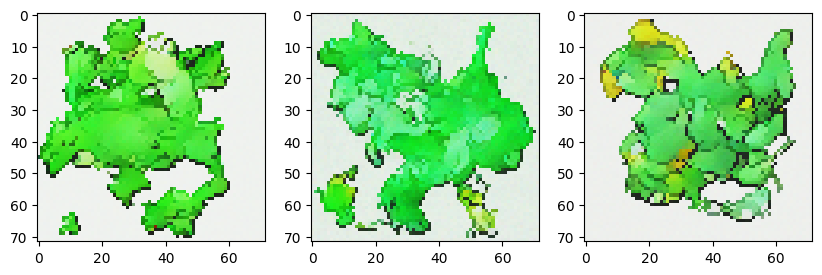

0.04189201:  55%|████████████████████████████████████████████████████████████████▎                                                    | 109997/200001 [1:03:18<46:56, 31.95it/s]

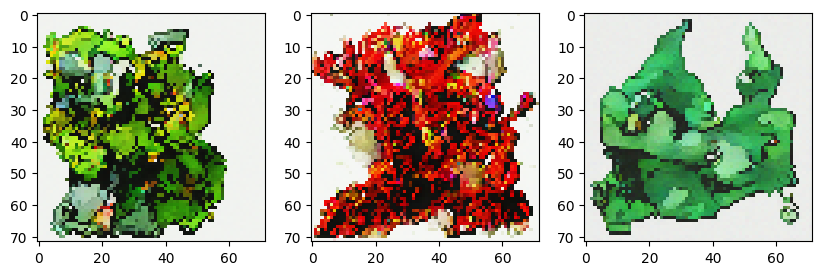

0.02204362:  55%|████████████████████████████████████████████████████████████████▉                                                    | 110997/200001 [1:03:53<46:30, 31.89it/s]

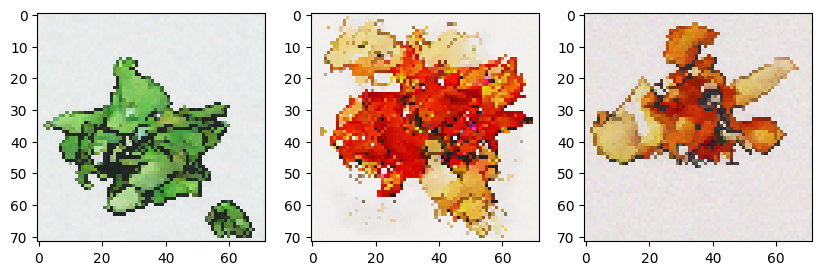

0.04458379:  56%|█████████████████████████████████████████████████████████████████▌                                                   | 111997/200001 [1:04:27<45:52, 31.97it/s]

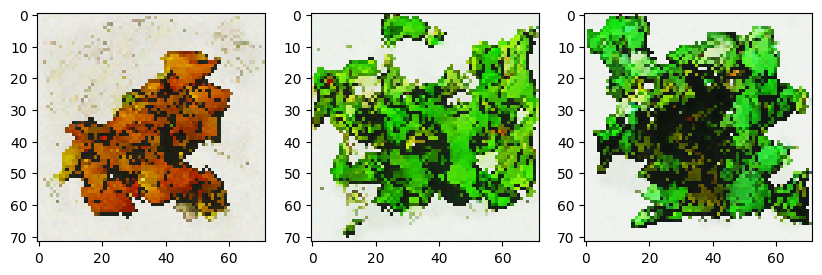

0.01793781:  56%|██████████████████████████████████████████████████████████████████                                                   | 112997/200001 [1:05:02<45:27, 31.90it/s]

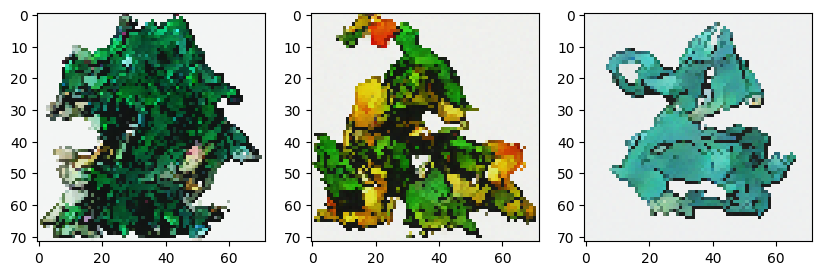

0.02462630:  57%|██████████████████████████████████████████████████████████████████▋                                                  | 113997/200001 [1:05:36<44:56, 31.90it/s]

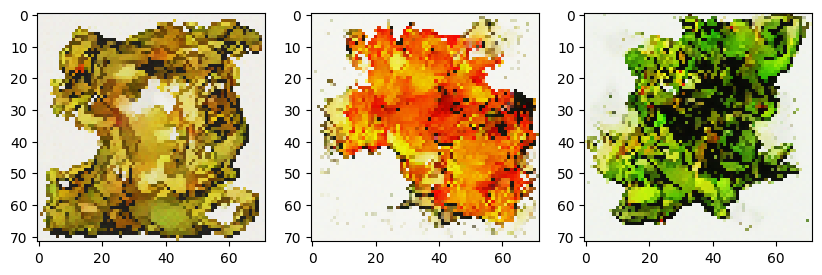

0.04500644:  57%|███████████████████████████████████████████████████████████████████▎                                                 | 114997/200001 [1:06:11<44:27, 31.87it/s]

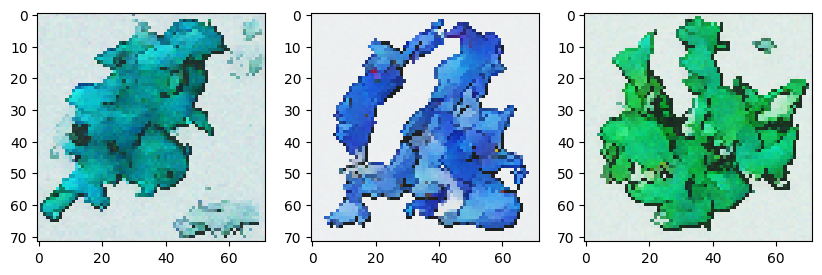

0.03554826:  58%|███████████████████████████████████████████████████████████████████▊                                                 | 115997/200001 [1:06:46<43:48, 31.95it/s]

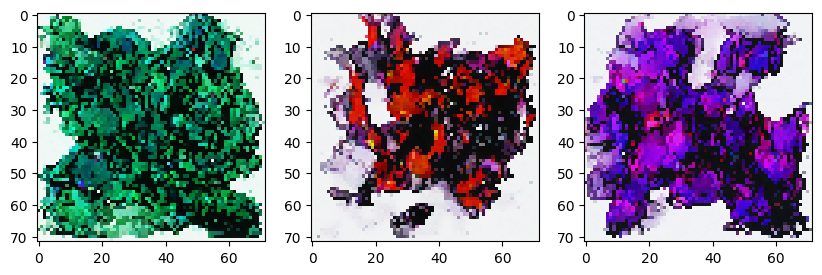

0.01645455:  58%|████████████████████████████████████████████████████████████████████▍                                                | 116997/200001 [1:07:20<43:19, 31.92it/s]

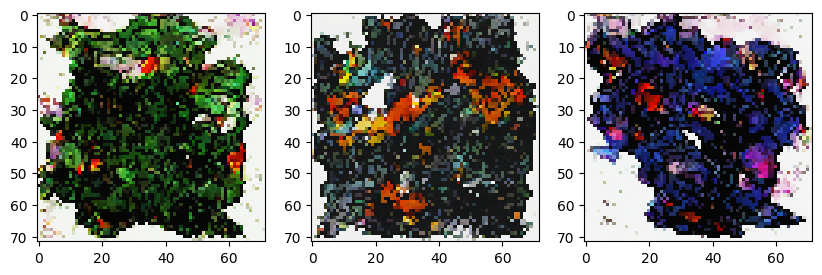

0.02686868:  59%|█████████████████████████████████████████████████████████████████████                                                | 117997/200001 [1:07:55<42:48, 31.92it/s]

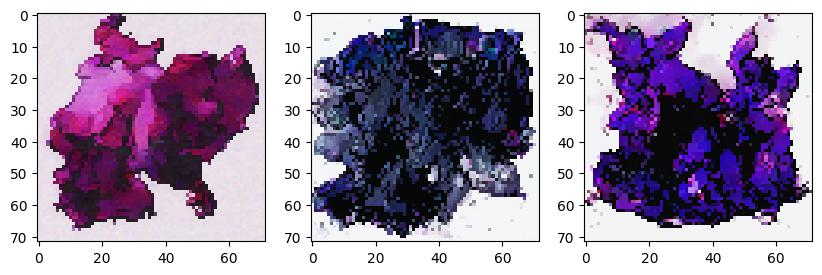

0.02059377:  59%|█████████████████████████████████████████████████████████████████████▌                                               | 118997/200001 [1:08:29<42:21, 31.87it/s]

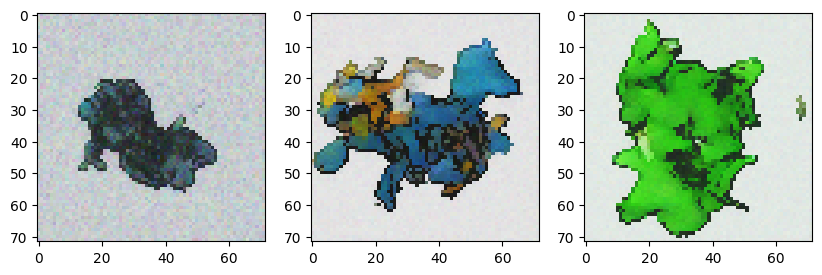

0.02480471:  60%|██████████████████████████████████████████████████████████████████████▏                                              | 119997/200001 [1:09:04<41:46, 31.92it/s]

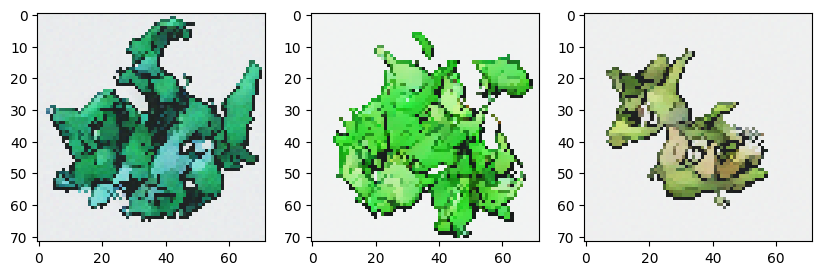

0.02489091:  60%|██████████████████████████████████████████████████████████████████████▊                                              | 120997/200001 [1:09:38<41:17, 31.89it/s]

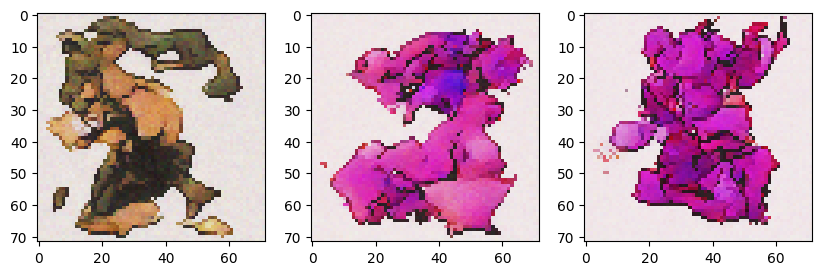

0.02055234:  61%|███████████████████████████████████████████████████████████████████████▎                                             | 121997/200001 [1:10:13<40:50, 31.83it/s]

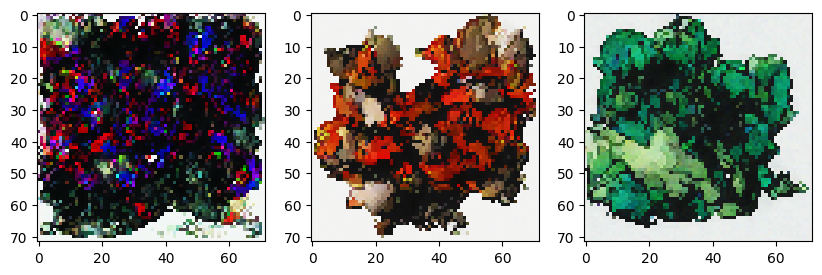

0.03249187:  61%|███████████████████████████████████████████████████████████████████████▉                                             | 122997/200001 [1:10:47<40:15, 31.88it/s]

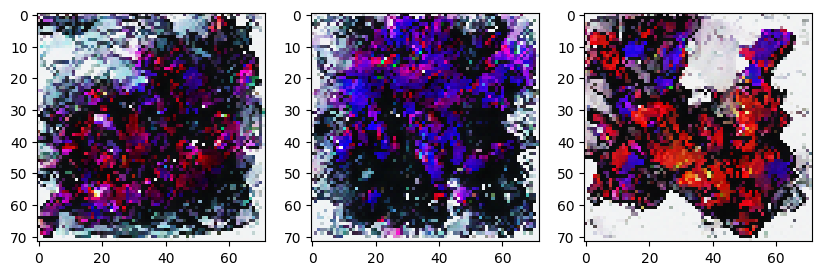

0.02083867:  62%|████████████████████████████████████████████████████████████████████████▌                                            | 123997/200001 [1:11:22<39:43, 31.88it/s]

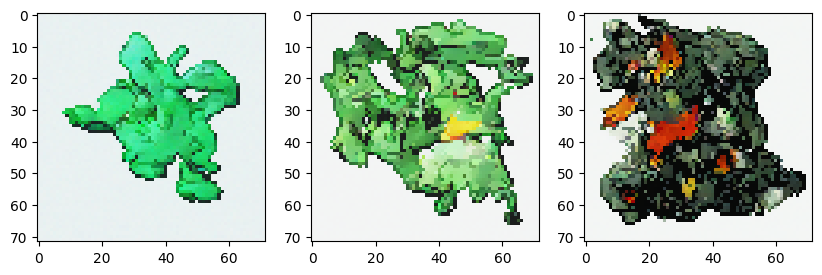

0.02571387:  62%|█████████████████████████████████████████████████████████████████████████                                            | 124997/200001 [1:11:56<39:11, 31.89it/s]

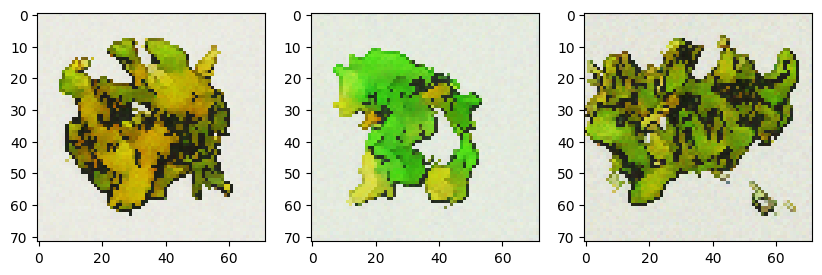

0.02037854:  63%|█████████████████████████████████████████████████████████████████████████▋                                           | 125997/200001 [1:12:31<38:34, 31.98it/s]

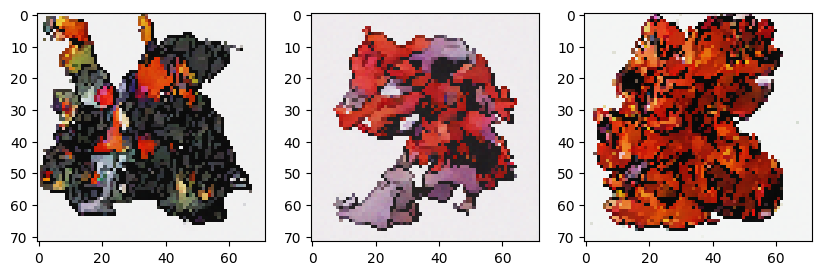

0.01790354:  63%|██████████████████████████████████████████████████████████████████████████▎                                          | 126997/200001 [1:13:06<38:07, 31.92it/s]

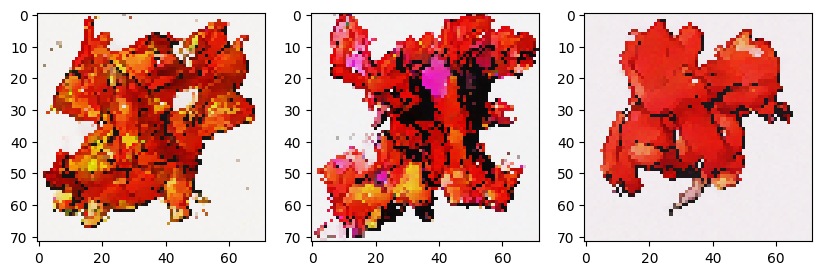

0.03625399:  64%|██████████████████████████████████████████████████████████████████████████▉                                          | 127997/200001 [1:13:40<37:35, 31.92it/s]

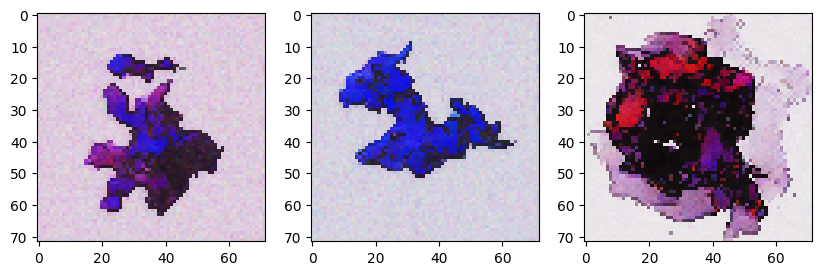

0.03133004:  64%|███████████████████████████████████████████████████████████████████████████▍                                         | 128997/200001 [1:14:15<37:05, 31.91it/s]

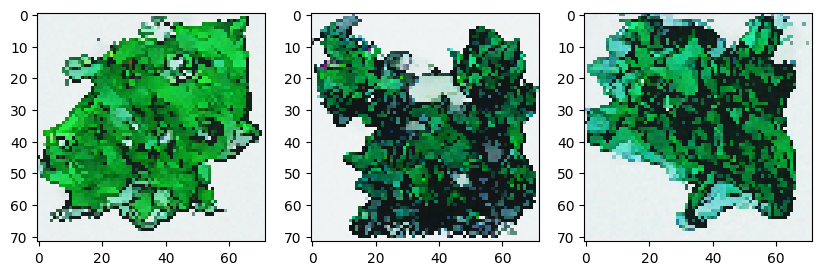

0.01504125:  65%|████████████████████████████████████████████████████████████████████████████                                         | 129997/200001 [1:14:49<36:35, 31.88it/s]

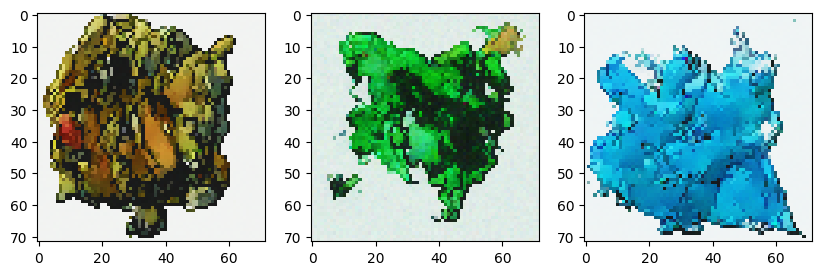

0.02865604:  65%|████████████████████████████████████████████████████████████████████████████▋                                        | 130997/200001 [1:15:24<36:03, 31.89it/s]

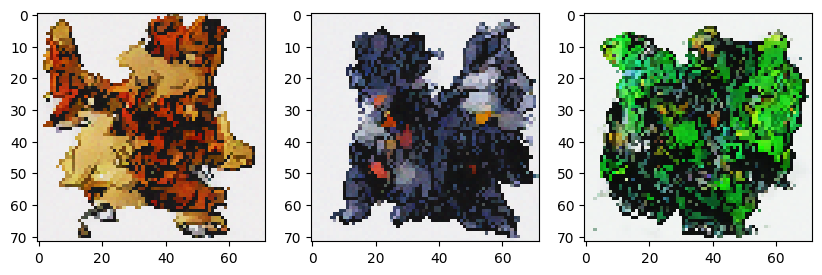

0.02475771:  66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 131997/200001 [1:15:58<35:32, 31.88it/s]

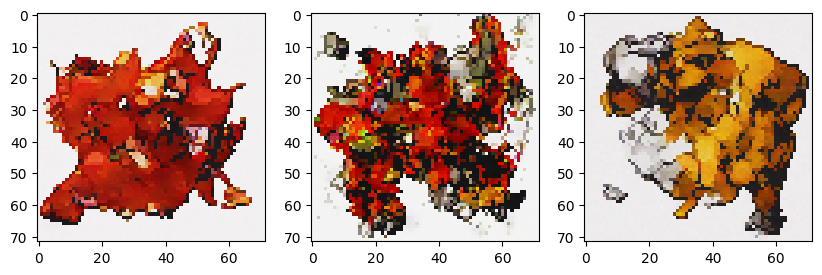

0.02452387:  66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 132997/200001 [1:16:33<34:59, 31.91it/s]

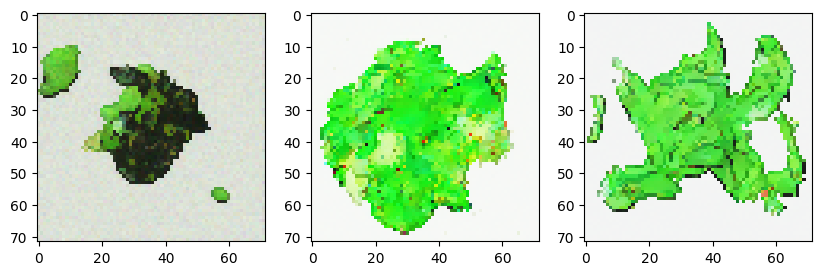

0.03151877:  67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 133997/200001 [1:17:08<34:26, 31.94it/s]

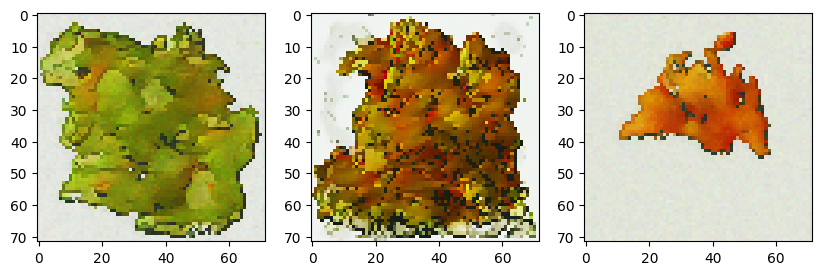

0.02971894:  67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 134997/200001 [1:17:42<33:57, 31.91it/s]

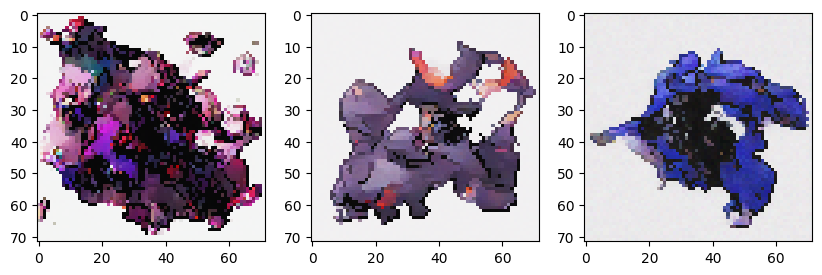

0.02985093:  68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 135997/200001 [1:18:17<33:23, 31.94it/s]

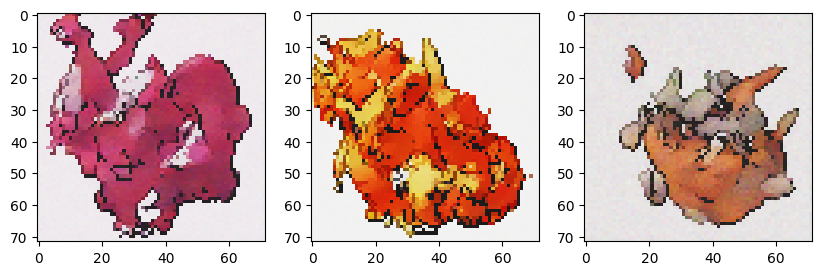

0.02946062:  68%|████████████████████████████████████████████████████████████████████████████████▏                                    | 136997/200001 [1:18:51<32:55, 31.89it/s]

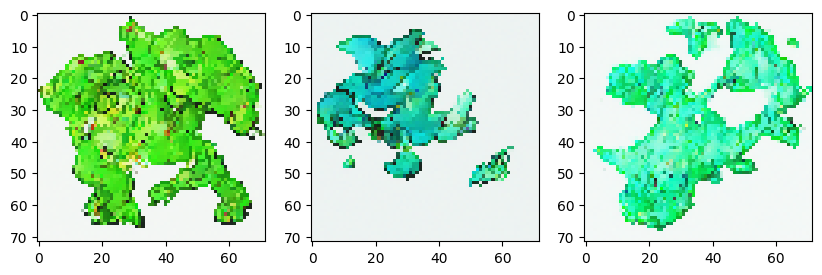

0.03378800:  69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 137997/200001 [1:19:26<32:25, 31.87it/s]

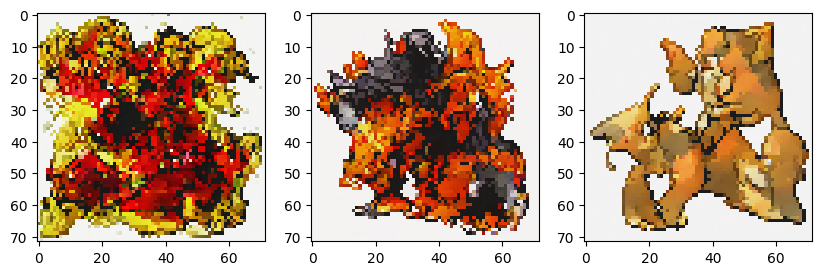

0.03767033:  69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 138997/200001 [1:20:00<31:49, 31.95it/s]

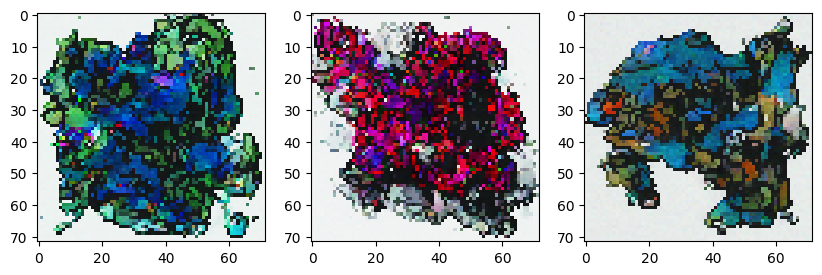

0.01573998:  70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 139997/200001 [1:20:35<31:20, 31.90it/s]

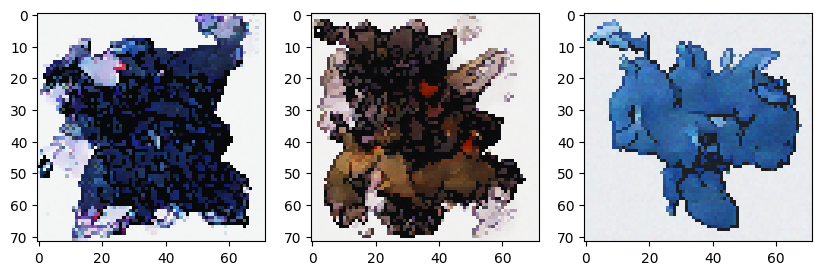

0.03019561:  70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 140997/200001 [1:21:09<30:48, 31.92it/s]

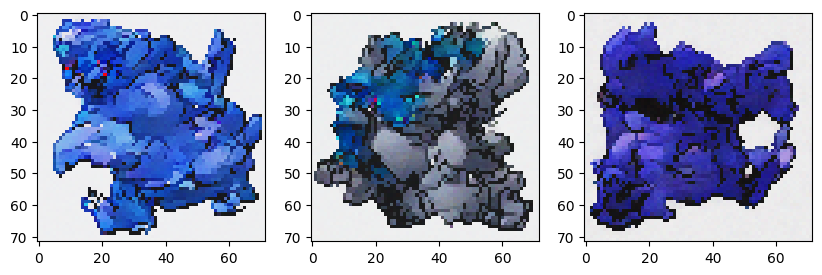

0.03562200:  71%|███████████████████████████████████████████████████████████████████████████████████                                  | 141997/200001 [1:21:44<30:14, 31.96it/s]

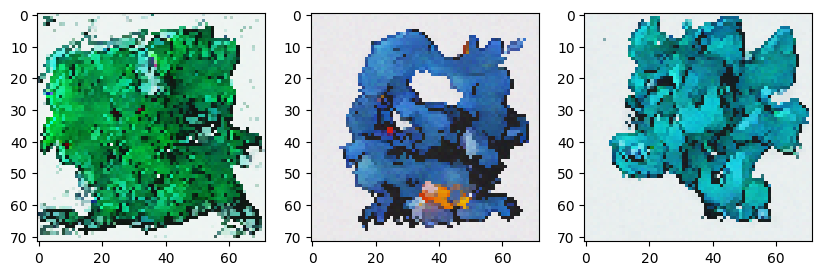

0.02965144:  71%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 142997/200001 [1:22:18<29:45, 31.92it/s]

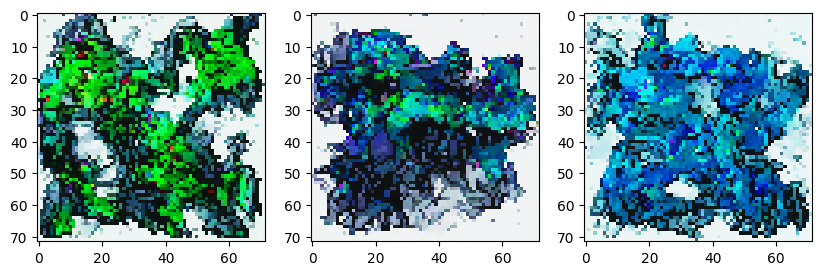

0.02289827:  72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 143997/200001 [1:22:53<29:16, 31.88it/s]

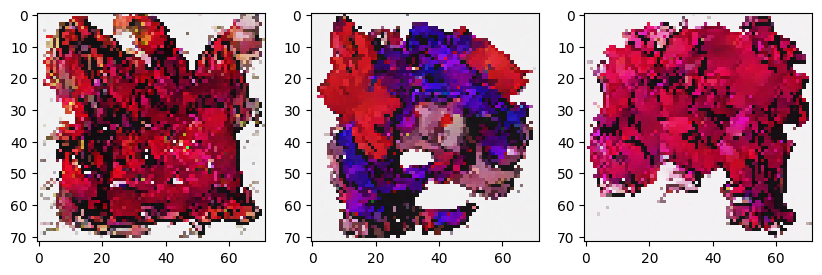

0.03581296:  72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 144997/200001 [1:23:27<28:41, 31.96it/s]

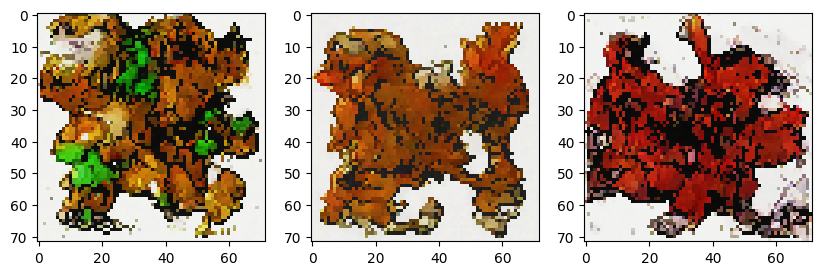

0.02519893:  73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 145997/200001 [1:24:02<28:08, 31.97it/s]

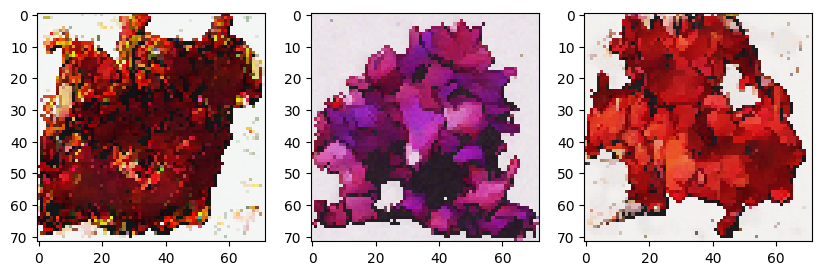

0.01898328:  73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 146997/200001 [1:24:36<27:37, 31.99it/s]

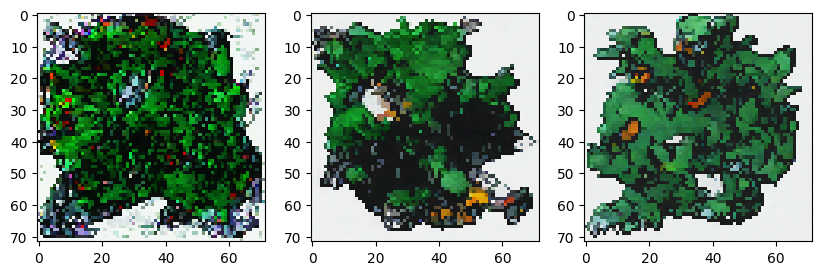

0.02335372:  74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 147997/200001 [1:25:11<27:10, 31.89it/s]

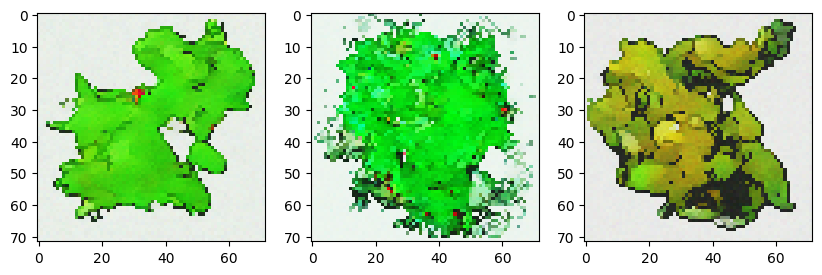

0.02286366:  74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 148997/200001 [1:25:46<26:33, 32.00it/s]

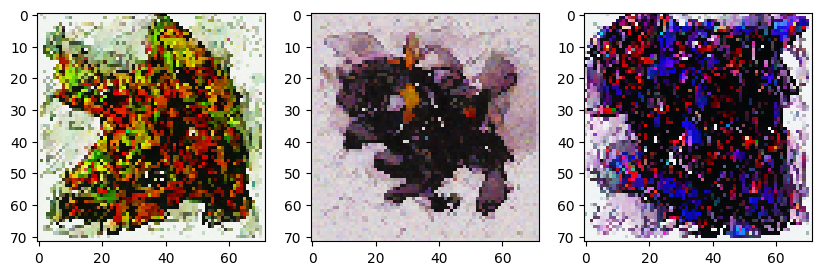

0.02906522:  75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 149997/200001 [1:26:20<26:07, 31.89it/s]

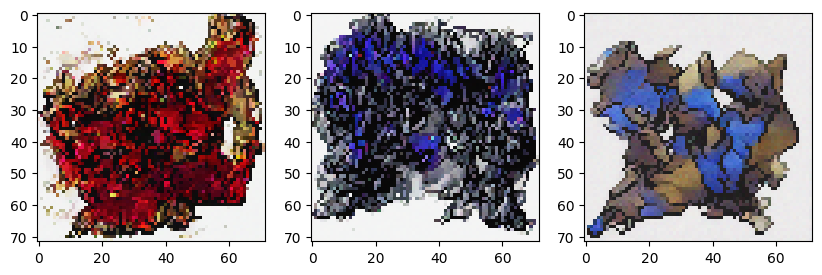

0.02179824:  75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 150997/200001 [1:26:55<25:34, 31.93it/s]

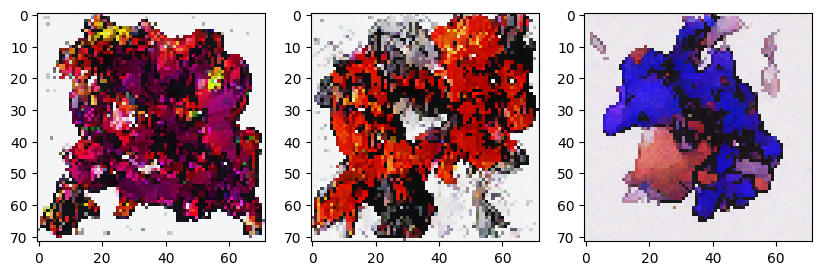

0.02967301:  76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 151997/200001 [1:27:29<25:01, 31.96it/s]

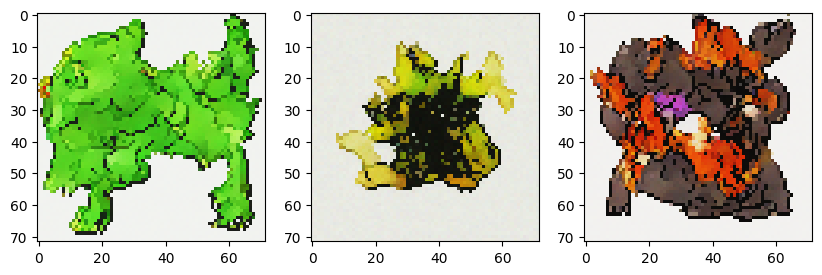

0.02738881:  76%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 152997/200001 [1:28:04<24:33, 31.89it/s]

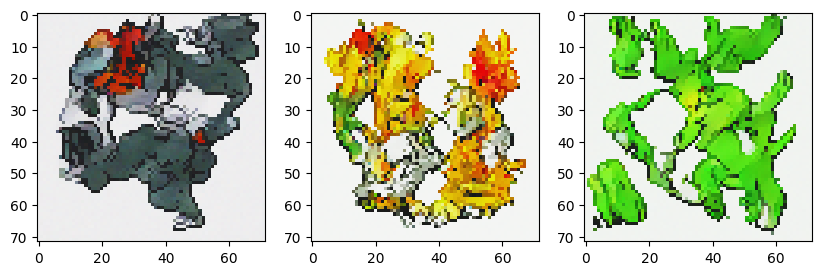

0.03196649:  77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 153997/200001 [1:28:38<24:00, 31.93it/s]

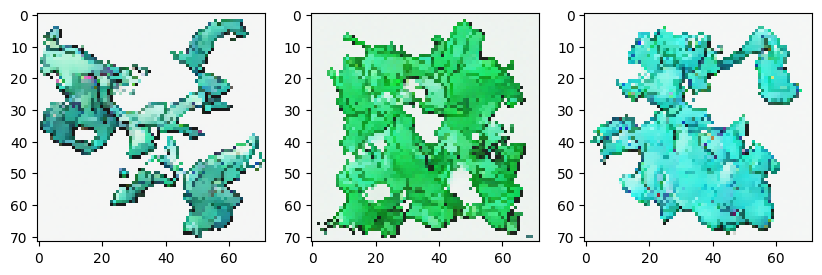

0.03904027:  77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 154997/200001 [1:29:13<23:31, 31.89it/s]

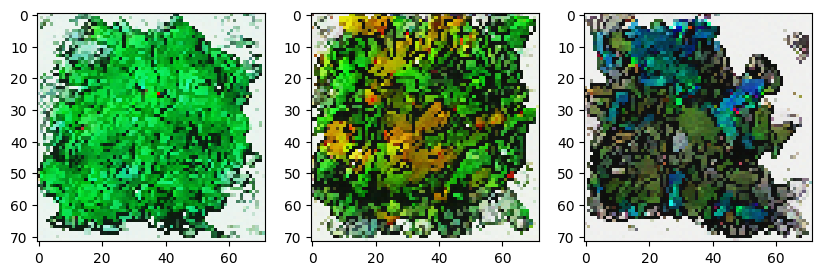

0.02060925:  78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 155997/200001 [1:29:47<22:57, 31.93it/s]

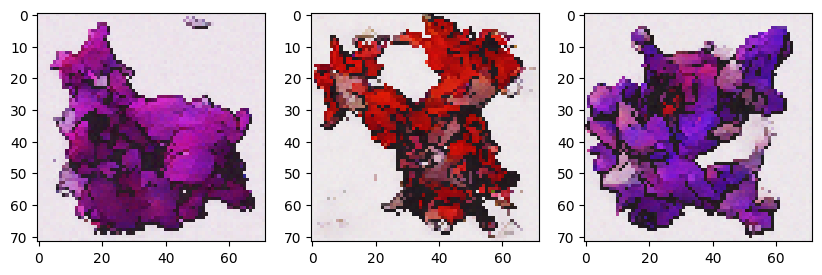

0.03679787:  78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 156997/200001 [1:30:22<22:27, 31.92it/s]

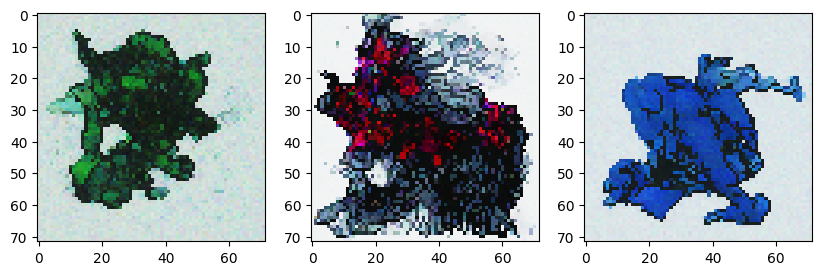

0.03587286:  79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 157997/200001 [1:30:56<21:57, 31.88it/s]

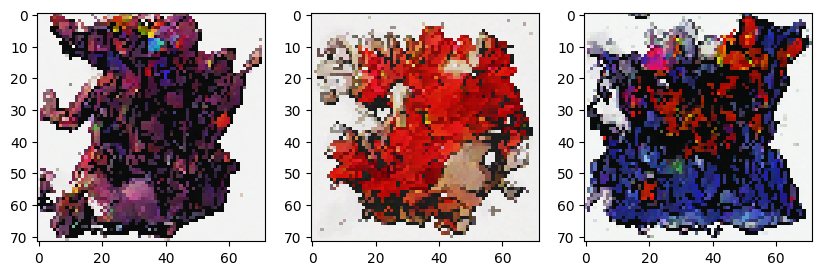

0.03261745:  79%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 158997/200001 [1:31:31<21:23, 31.94it/s]

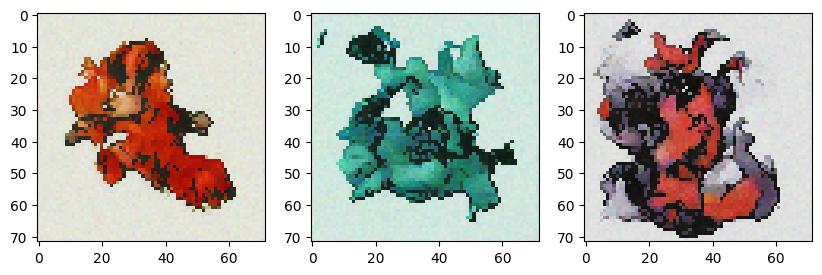

0.06127126:  80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 159997/200001 [1:32:05<20:52, 31.94it/s]

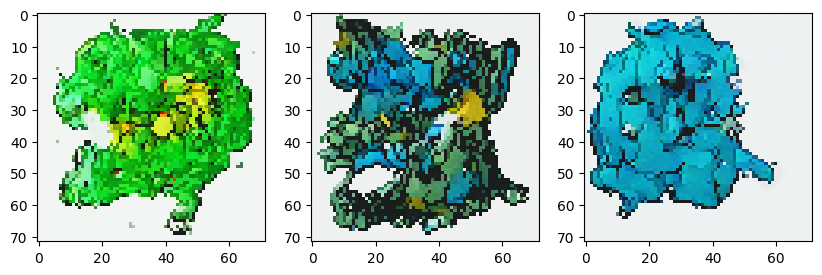

0.02690563:  80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 160997/200001 [1:32:40<20:20, 31.96it/s]

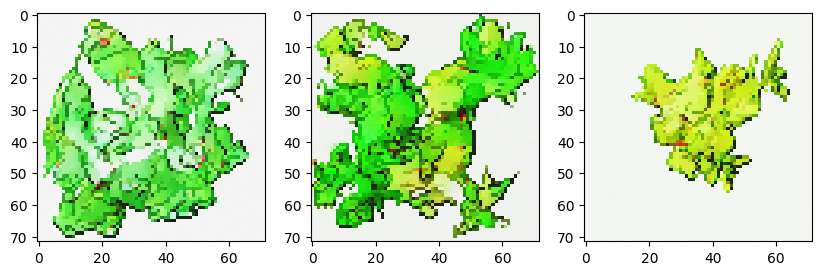

0.02757619:  81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 161997/200001 [1:33:14<19:52, 31.86it/s]

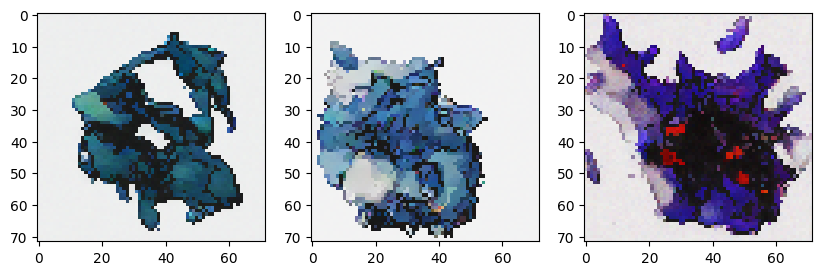

0.04117005:  81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 162997/200001 [1:33:49<19:18, 31.93it/s]

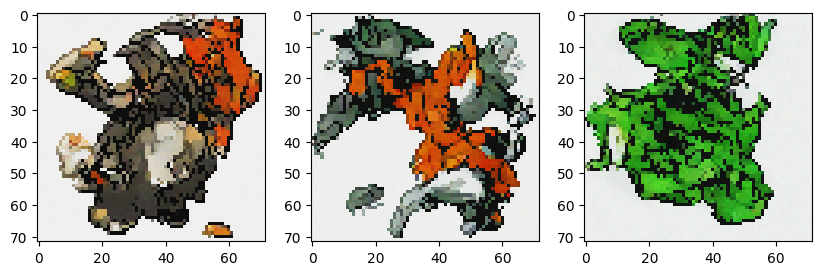

0.03826556:  82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 163997/200001 [1:34:24<18:47, 31.94it/s]

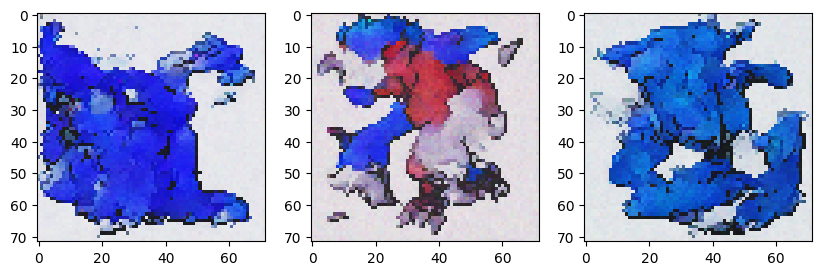

0.04561756:  82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 164997/200001 [1:34:58<18:17, 31.91it/s]

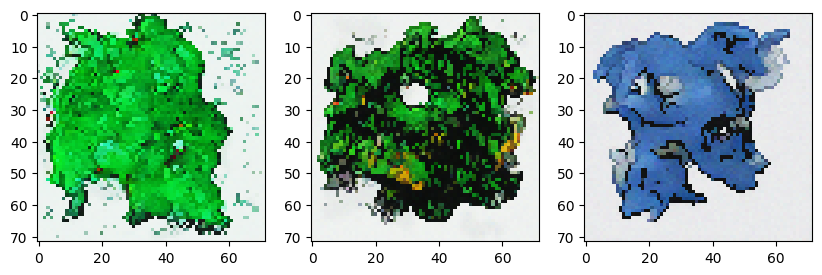

0.02508559:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 165997/200001 [1:35:33<17:44, 31.94it/s]

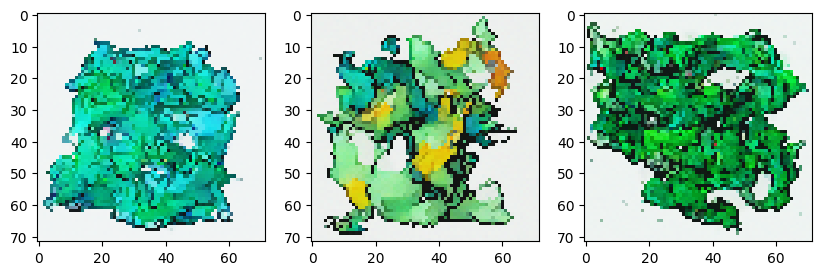

0.03081762:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 166997/200001 [1:36:07<17:14, 31.90it/s]

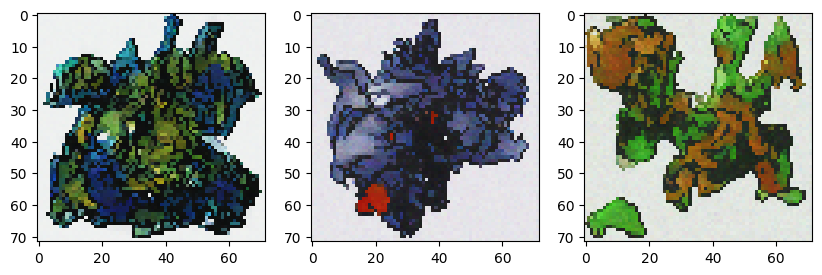

0.02842611:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 167997/200001 [1:36:42<16:43, 31.88it/s]

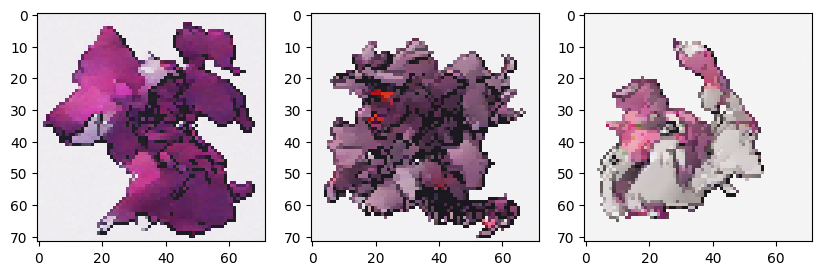

0.02089156:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 168997/200001 [1:37:16<16:11, 31.91it/s]

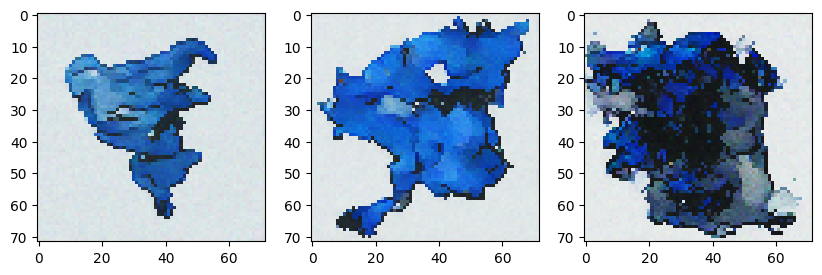

0.01678618:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 169997/200001 [1:37:51<15:39, 31.94it/s]

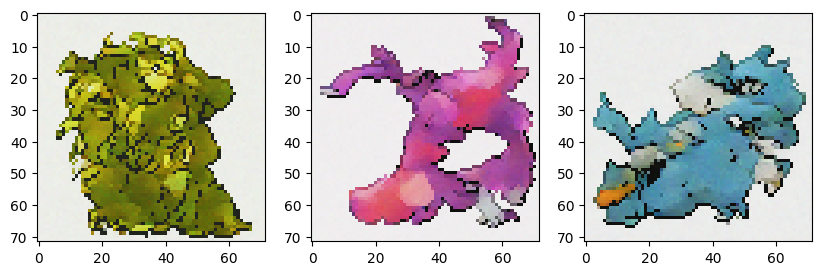

0.03660243:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 170997/200001 [1:38:25<15:04, 32.07it/s]

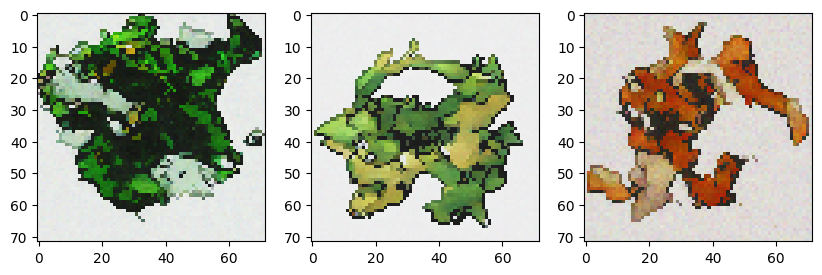

0.02758376:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 171997/200001 [1:39:00<14:36, 31.95it/s]

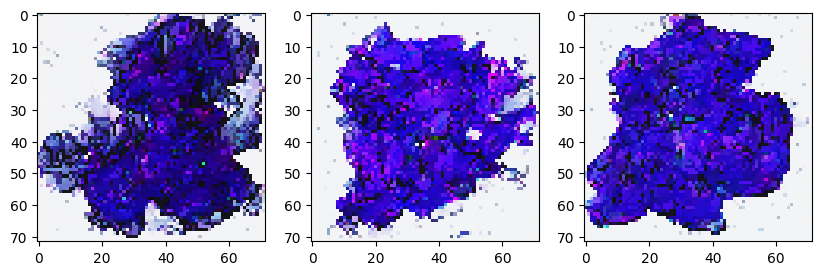

0.02616346:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 172997/200001 [1:39:34<14:04, 31.98it/s]

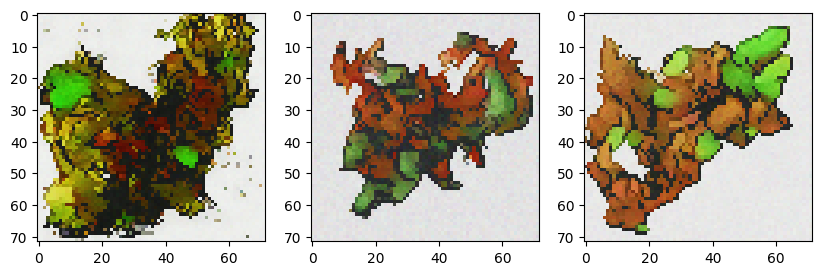

0.01253830:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 173997/200001 [1:40:09<13:34, 31.94it/s]

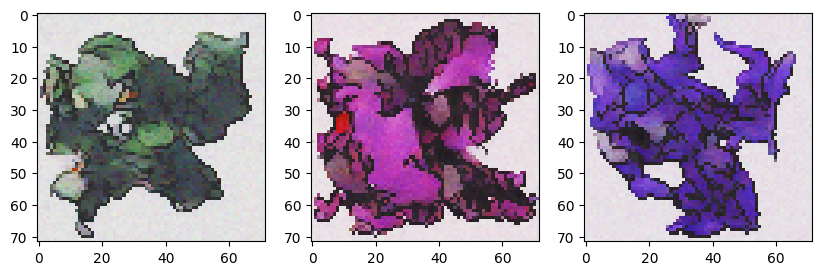

0.02412988:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 174997/200001 [1:40:43<13:03, 31.90it/s]

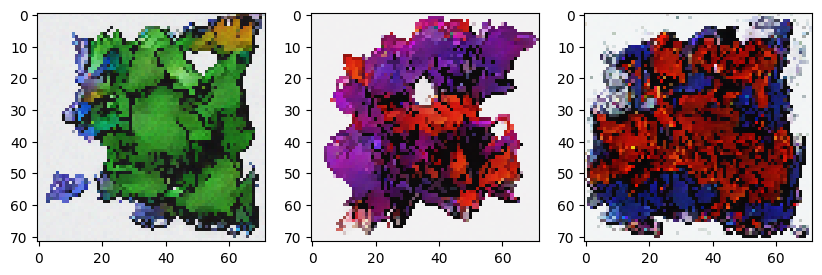

0.02285380:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 175997/200001 [1:41:18<12:32, 31.91it/s]

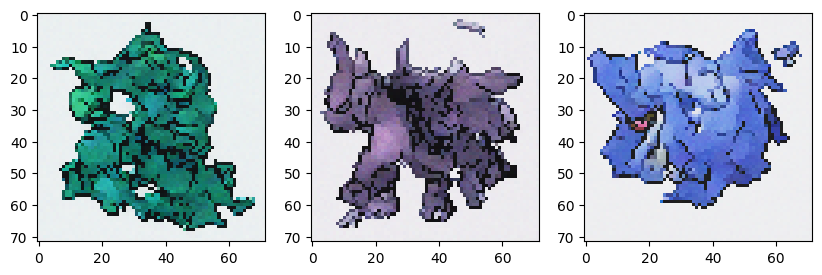

0.03364747:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 176997/200001 [1:41:52<12:01, 31.89it/s]

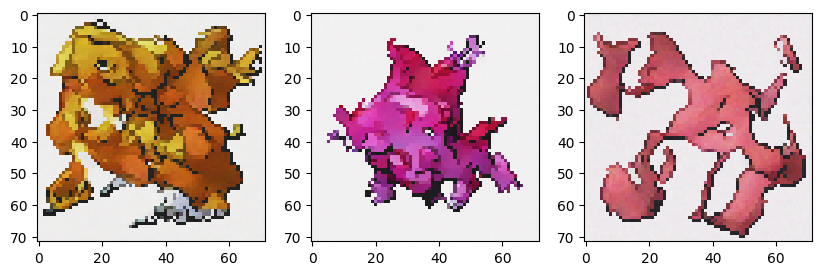

0.03609135:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 177997/200001 [1:42:27<11:30, 31.89it/s]

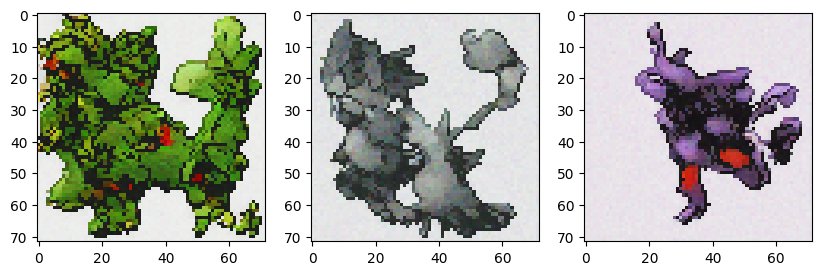

0.01015147:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 178997/200001 [1:43:02<10:57, 31.96it/s]

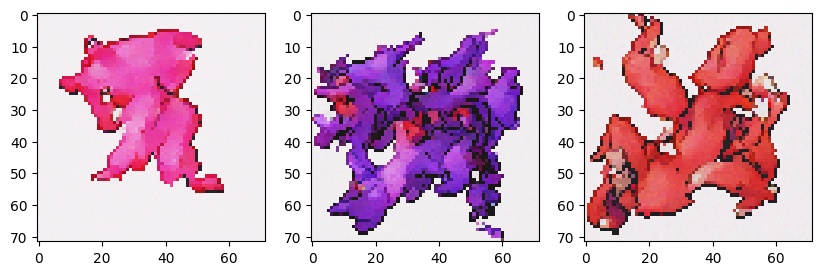

0.02544568:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 179997/200001 [1:43:36<10:26, 31.94it/s]

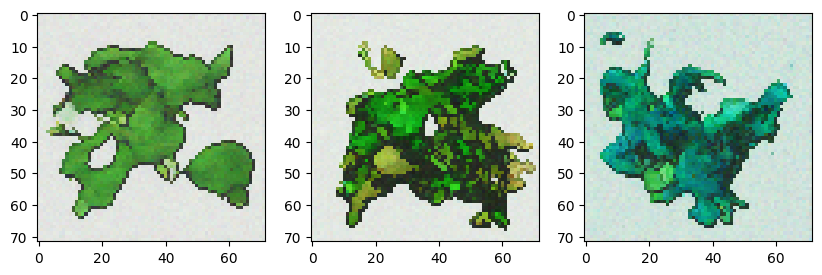

0.04341373:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 180997/200001 [1:44:11<09:55, 31.92it/s]

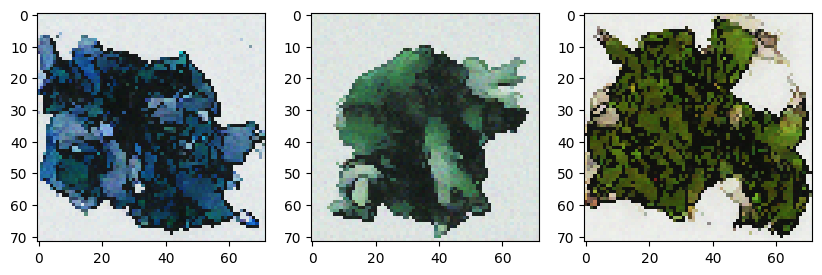

0.02904751:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 181997/200001 [1:44:45<09:24, 31.92it/s]

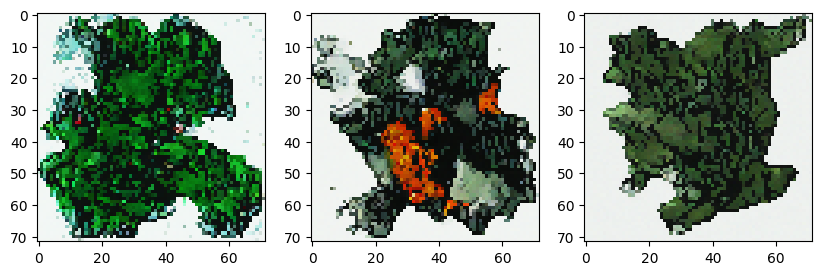

0.02946438:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 182997/200001 [1:45:20<08:52, 31.96it/s]

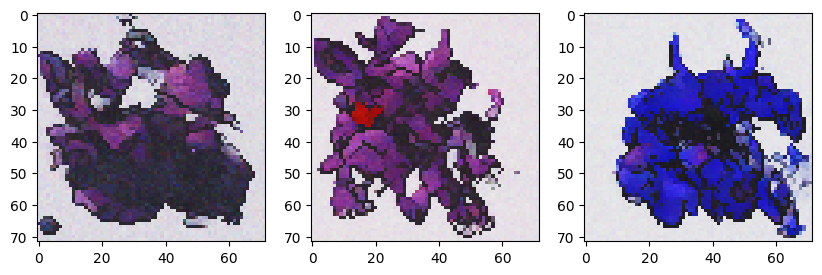

0.01824647:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 183997/200001 [1:45:54<08:20, 31.97it/s]

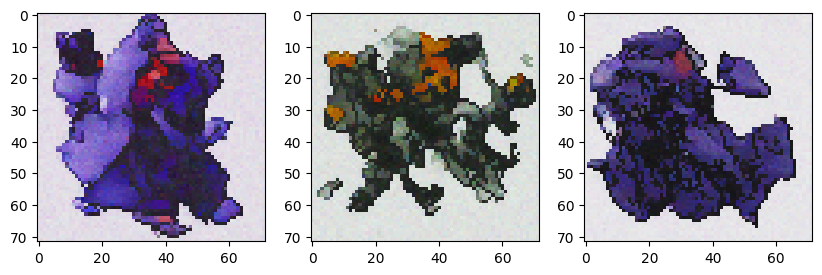

0.01822868:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 184997/200001 [1:46:29<07:48, 32.01it/s]

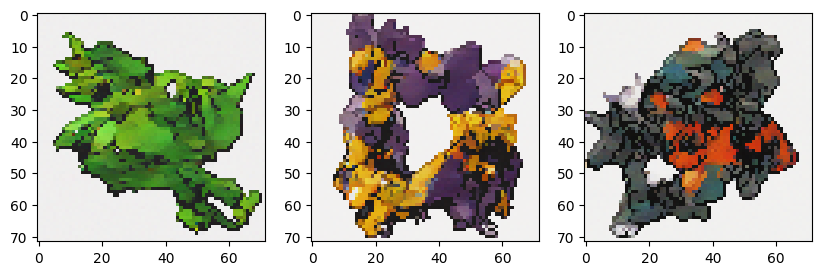

0.03831851:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 185997/200001 [1:47:03<07:20, 31.81it/s]

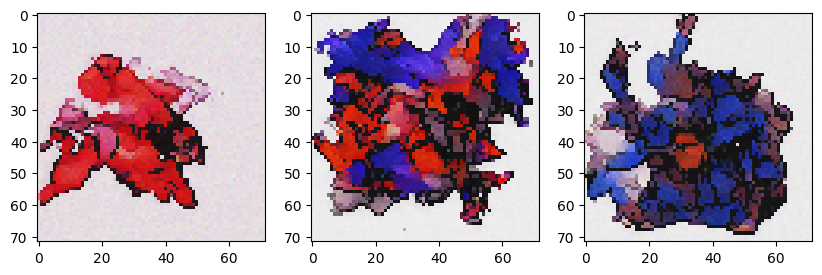

0.01394201:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 186997/200001 [1:47:38<06:46, 31.96it/s]

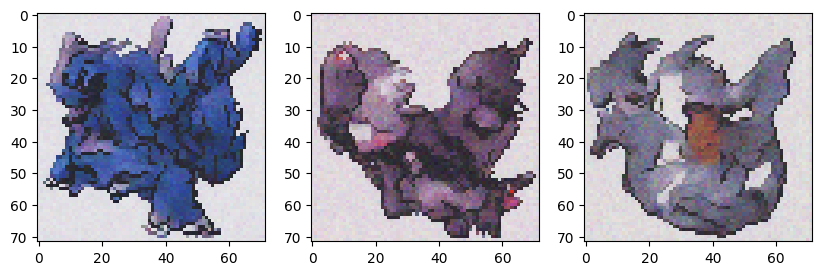

0.05137460:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 187997/200001 [1:48:12<06:15, 32.01it/s]

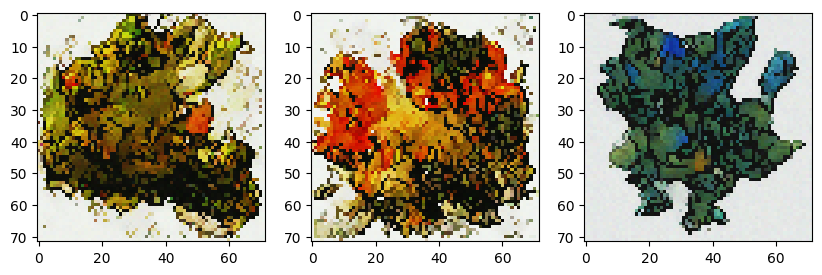

0.02232949:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 188997/200001 [1:48:47<05:44, 31.94it/s]

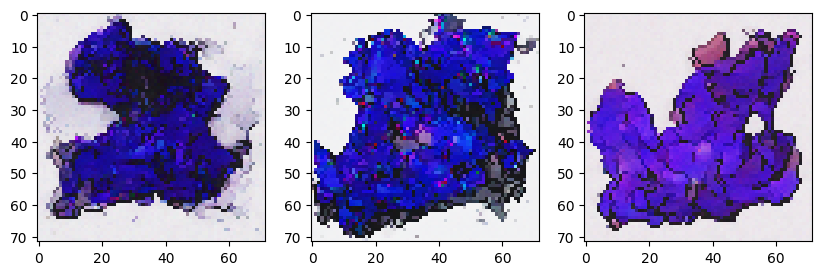

0.01820068:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 189997/200001 [1:49:21<05:13, 31.87it/s]

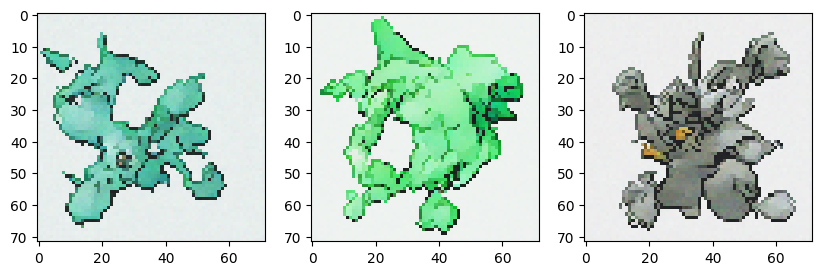

0.02559605:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 190997/200001 [1:49:56<04:42, 31.89it/s]

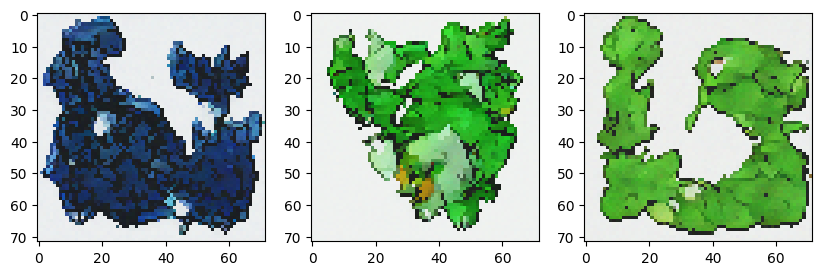

0.02397378:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 191997/200001 [1:50:30<04:10, 31.94it/s]

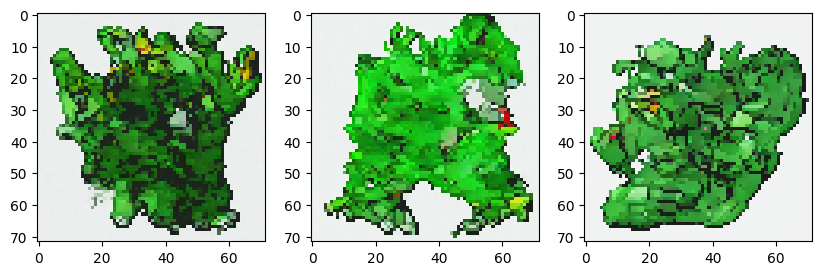

0.02501748:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 192997/200001 [1:51:05<03:39, 31.91it/s]

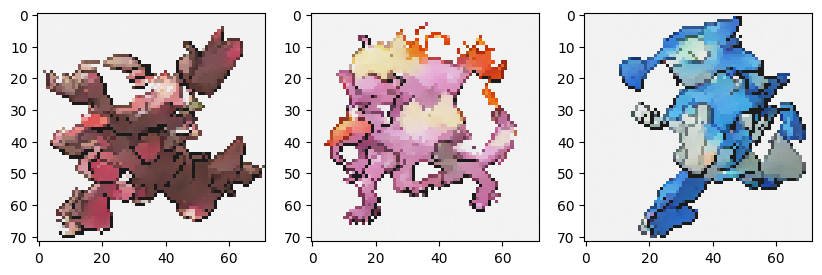

0.03125887:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 193997/200001 [1:51:39<03:07, 31.97it/s]

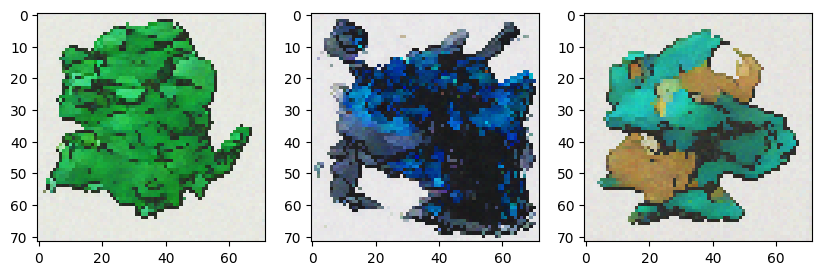

0.02615610:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 194997/200001 [1:52:14<02:36, 31.93it/s]

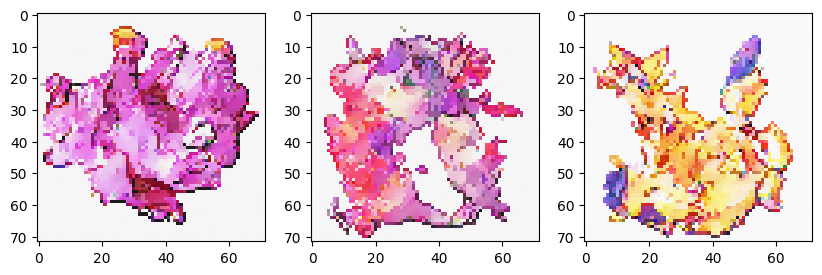

0.03674100:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 195997/200001 [1:52:48<02:05, 31.95it/s]

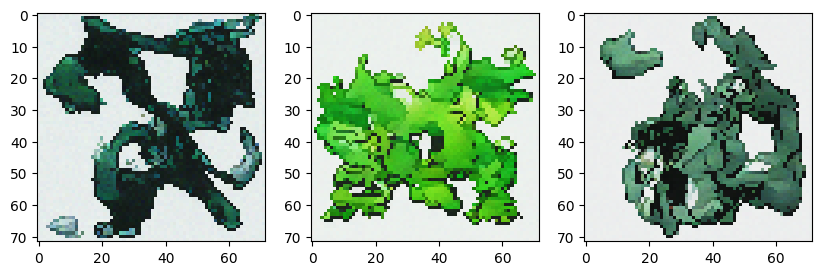

0.02008935:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 196997/200001 [1:53:23<01:34, 31.93it/s]

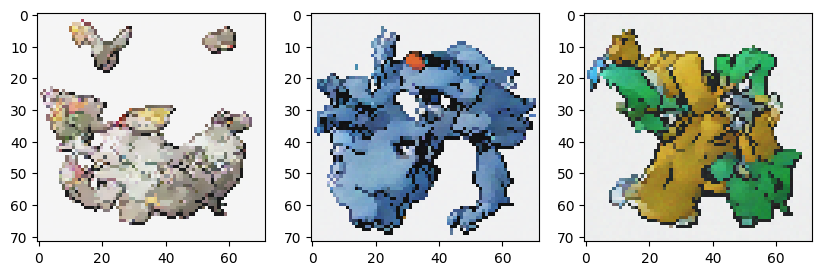

0.03160623:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 197997/200001 [1:53:57<01:02, 31.94it/s]

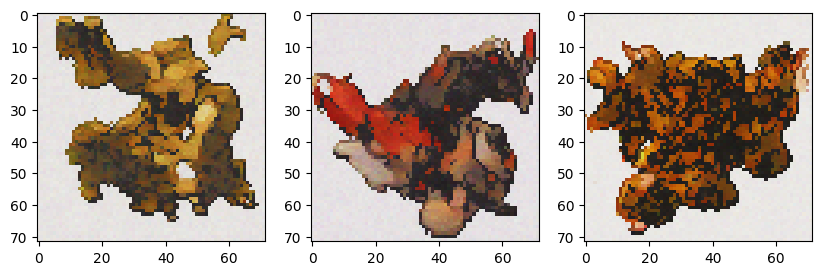

0.02799180:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 198997/200001 [1:54:32<00:31, 31.93it/s]

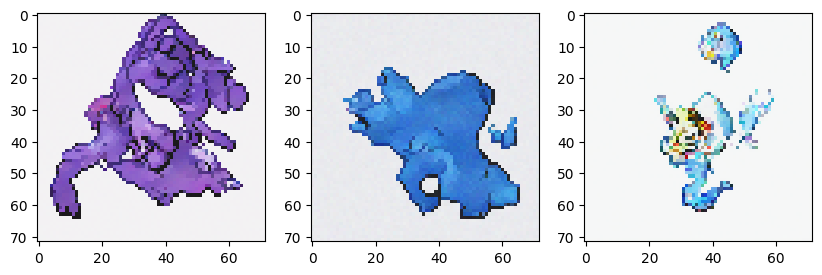

0.03076688: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 199997/200001 [1:55:07<00:00, 31.93it/s]

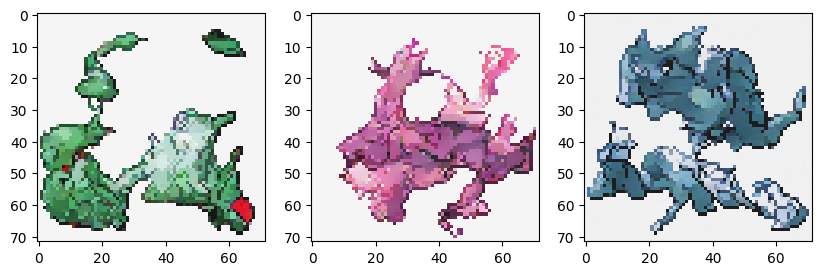

0.03037690: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200001/200001 [1:55:10<00:00, 28.94it/s]


In [8]:
loss_func = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
pbar = tqdm(range(200001))
def closure():
    optimizer.zero_grad()

    bs = 8

    source = randint(0, 2)
    batch = torch.randperm(385)[:bs]
    x0 = pimages[source, batch]
    x0 = torch.stack([transform(x) for x in x0], dim=0)
    x0 = isigmoid(x0)

    ty = types[batch]
    
    e = torch.randn_like(x0)
    t = torch.randint(0, T - 1, (bs,), device=device)

    xt = torch.sqrt(alpha_[t])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[t])[:, None, None, None] * e
    ep = model(xt, t, ty)

    loss = loss_func(ep, e)
    loss.backward()
    
    pbar.set_description(f"%.8f" % loss, refresh=False)
    
    return loss

model.train()
for j in pbar:
    optimizer.step(closure)

    if j % 1000 == 0:
        generate_image()

torch.save(model.state_dict(), 'model.pt')